In [72]:
library("ggplot2")
library("igraph")

# 1. Facebook network

## 1. Structural properties of the Facebook network

Question 1: A first look at the network

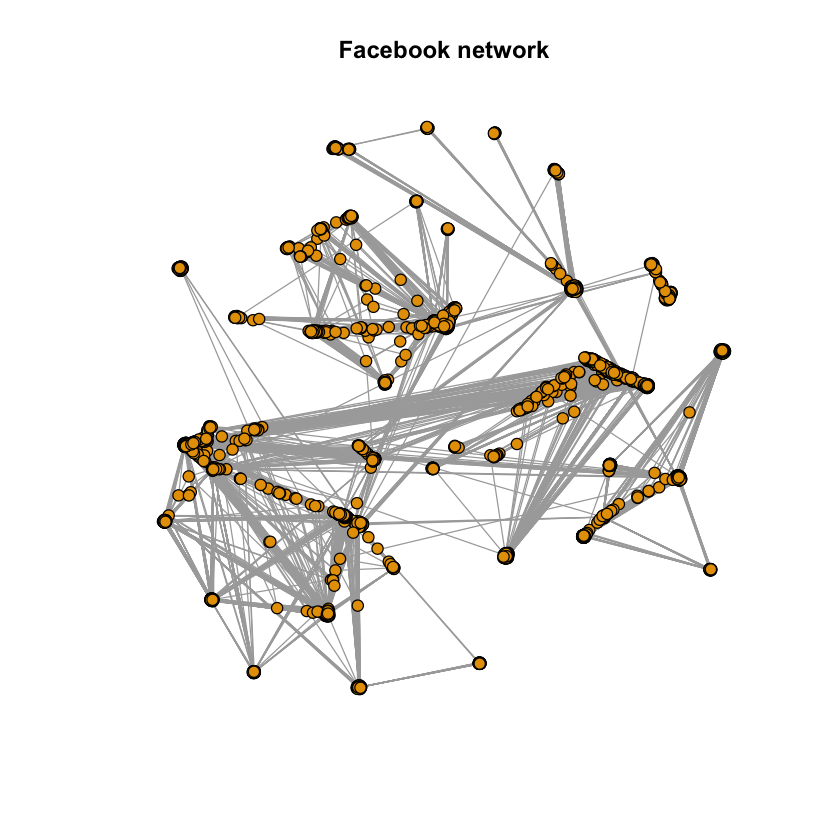

In [73]:
fb_combined = read.table("facebook_combined.txt")
tmp_mat = as.matrix(fb_combined)+1
g = graph.edgelist(tmp_mat,directed=FALSE) 
plot(g, edge.arrow.size=.1, vertex.size=4, vertex.label=NA, main="Facebook network")

Question 1.1: Report the number of nodes and number of edges of the Facebook network.

In [74]:
sprintf('Number of nodes: %s',vcount(g))
sprintf('Number of edges: %s',ecount(g))

[1] "Number of nodes: 4039"

[1] "Number of edges: 88234"

Question 1.2: Is the Facebook network connected? If not, find the giant connected component (GCC) of the network and report the size of the GCC.

In [75]:
print(paste("Network connected: ", is_connected(g)))

[1] "Network connected:  TRUE"


Question 2: Find the diameter of the network. If the network is not connected, then find the diameter of the GCC.

In [76]:
print(paste("Network diameter: ", diameter(g)))

[1] "Network diameter:  8"


Question 3: Plot the degree distribution of the facebook network and report the average degree.

[1] "Average network degree:  522.5"


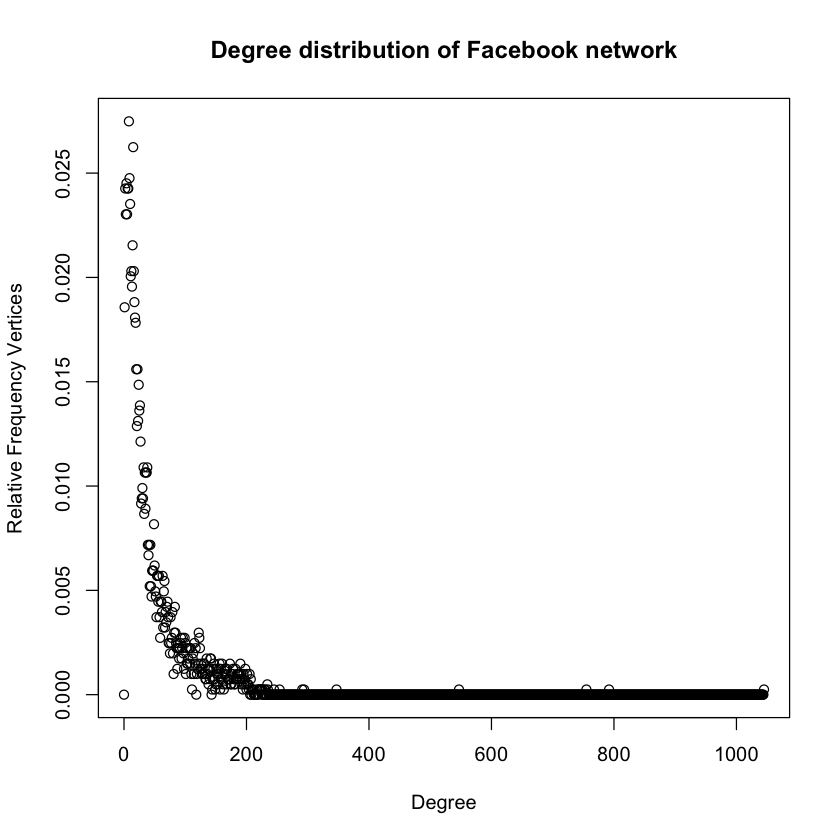

In [77]:
unique_degrees = unique(sort(degree(g)))
if (unique_degrees[1]!=0) {
    unique_degrees = seq(0,max(unique_degrees))
}
dd = degree_distribution(g)

plot(unique_degrees, dd, main="Degree distribution of Facebook network", xlab="Degree", ylab="Relative Frequency Vertices")
print(paste("Average network degree: ", mean(unique_degrees)))

Question 4: Plot the degree distribution of Question 3 in a log-log scale. Try to fit a line to the plot and estimate the slope of the line.


Call:
lm(formula = log_distr_y ~ log_degree_x)

Residuals:
    Min      1Q  Median      3Q     Max 
-2.4605 -0.3011  0.1542  0.3843  1.0310 

Coefficients:
             Estimate Std. Error t value Pr(>|t|)    
(Intercept)  -0.66108    0.17441   -3.79 0.000193 ***
log_degree_x -1.24753    0.03791  -32.90  < 2e-16 ***
---
Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

Residual standard error: 0.5481 on 225 degrees of freedom
Multiple R-squared:  0.8279,	Adjusted R-squared:  0.8272 
F-statistic:  1083 on 1 and 225 DF,  p-value: < 2.2e-16


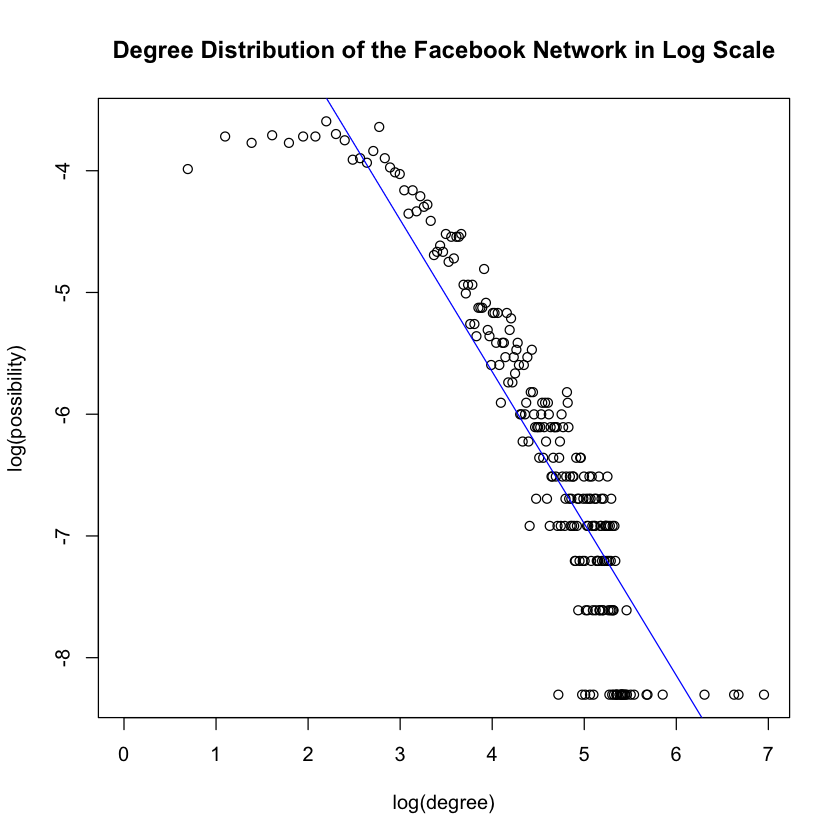

In [78]:
log_degree = log(c(1:length(degree.distribution(g))))
log_distr = log(degree.distribution(g))

log_degree_x = log_degree[-which(is.infinite(log_distr))]
log_distr_y = log_distr[-which(is.infinite(log_distr))]

lr = lm(log_distr_y~log_degree_x)
plot(log_degree, log_distr, main="Degree Distribution of the Facebook Network in Log Scale",xlab="log(degree)",ylab="log(possibility)")
abline(lr, col="blue")
summary(lr)

The slope of the line is -1.25.

## 2. Personalized network

Question 5: Create a personalized network of the user whose ID is 1. How many nodes and edges does this personalized network have?

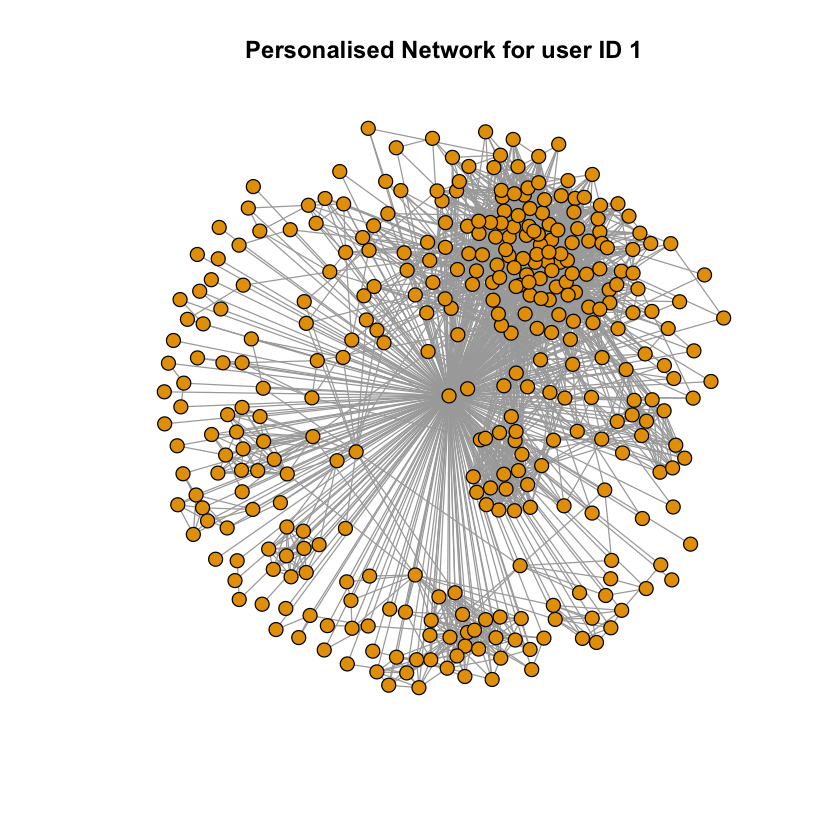

In [79]:
g1 = make_ego_graph(g, order=1,nodes=c('1'))[[1]]
test = plot(g1, edge.arrow.size=.1, vertex.size=5, vertex.label=NA,main="Personalised Network for user ID 1")

In [80]:
print(paste("Network ID 1 number of nodes: ", vcount(g1)))
print(paste("Network ID 1 number of edges: ", ecount(g1)))

[1] "Network ID 1 number of nodes:  348"
[1] "Network ID 1 number of edges:  2866"


Question 6: What is the diameter of the personalized network? Please state a trivial upper and lower bound for the diameter of the personalized network.

In [81]:
print(paste("Network connected: ", is_connected(g1)))
print(paste("Network diameter: ", diameter(g1)))

[1] "Network connected:  TRUE"
[1] "Network diameter:  2"


A trivial upper bound for the diameter of the personalized network is dependent on the number of nodes N in the graph, so N-1. A trivial lower bound is 2, which is the smallest possible diameter for any given network.

Question 7: In the context of the personalized network, what is the meaning of the diameter of the personalized network to be equal to the upper bound you derived in Question 6. What is the meaning of the diameter of the personalized network to be equal to the lower bound you derived in Question 6 (assuming there are more than 3 nodes in the personalized network)?

When the diameter of the network is equal to the upper bound, then a node has only edge between the next forming a string of nodes. In this case, the diameter would be N-1, where N is the number of nodes. When the diameter of the network is equal to the lower bound, then every node stems from one node. In this case, the diameter is 2 since all nodes are connected to the rest by the central node.

## 3. Core node's personalized network

Question 8: How many core nodes are there in the Facebook network. What is the average degree of the core nodes?

In [82]:
facebook_net = g
core_nodes = c()

for (i in degree(facebook_net)){
  if (i > 200) {
    core_nodes = c(core_nodes, i)
  }
}

print(paste('Number of core nodes:', length(core_nodes)))
print(paste('Average Degree:', mean(core_nodes)))

[1] "Number of core nodes: 40"
[1] "Average Degree: 279.375"


### 3.1. Community structure of core node’s personalized network

Question 9: For each of the above core node’s personalized network, find the community structure using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare the modularity scores of the algorithms. For visualization purpose, display the community structure of the core node’s personalized networks using colors. Nodes belonging to the same community should have the same color and nodes belonging to different communities should have different color. In this question, you should have 15 plots in total.

In [83]:
#helper function for community dection algorithms
community_detect = function(g, node_id) {
  fg <- fastgreedy.community(g)
  eb <- edge.betweenness.community(g)
  info_map <- infomap.community(g)

  cat("Node:", node_id, "\n") #make print output separator
  print(sprintf('Fast-Greedy Modularity Node %s is %s', node_id, modularity(fg)))
  print(sprintf('Edge-Betweenness Modularity Node %s is %s', node_id, modularity(eb)))
  print(sprintf('Info Map Modularity Node %s is %s', node_id, modularity(info_map)))
 
  
  plot(g, mark.groups = groups(fg), edge.arrow.size=0.1, vertex.color=fg$membership, vertex.size=5, vertex.label = NA, main=sprintf("Fast-Greedy; Core Node: %s", node_id))
  

  
  plot(g, mark.groups = groups(eb), edge.arrow.size=0.1, vertex.color=eb$membership, vertex.size=5, vertex.label = NA, main=sprintf("Edge-Betweenness; Core Node: %s", node_id))
  

  
  plot(g, mark.groups = groups(info_map), edge.arrow.size=0.1, vertex.color=info_map$membership, vertex.size=5, vertex.label = NA, main=sprintf("Info Map; Core Node: %s", node_id))
  
  cat('\n')
}

Node: 1 
[1] "Fast-Greedy Modularity Node 1 is 0.413101372834235"
[1] "Edge-Betweenness Modularity Node 1 is 0.353302172546335"
[1] "Info Map Modularity Node 1 is 0.389118471050977"


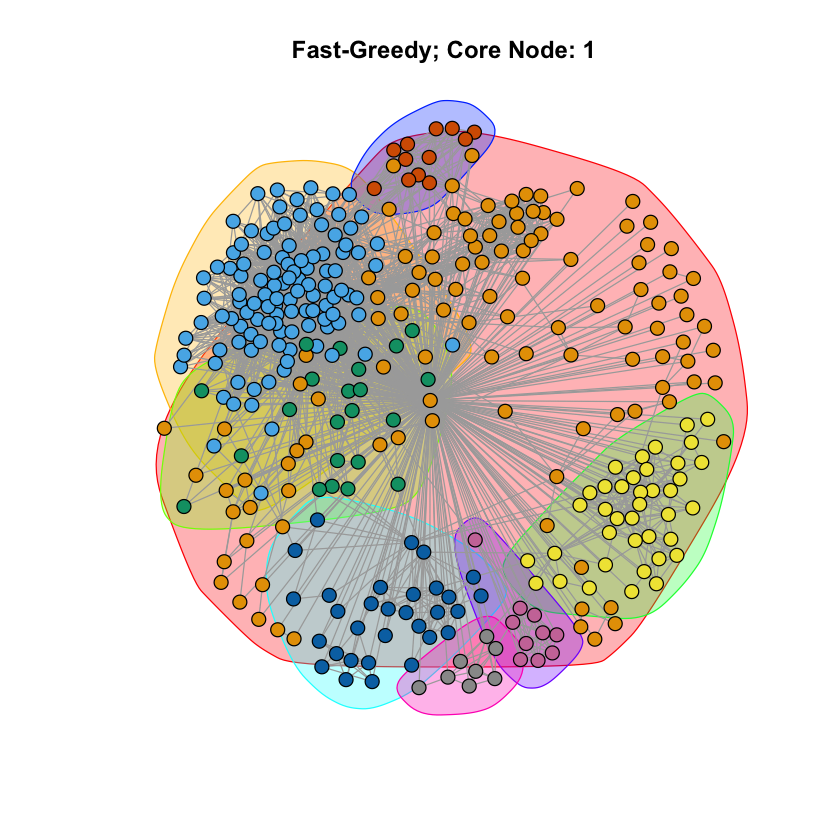

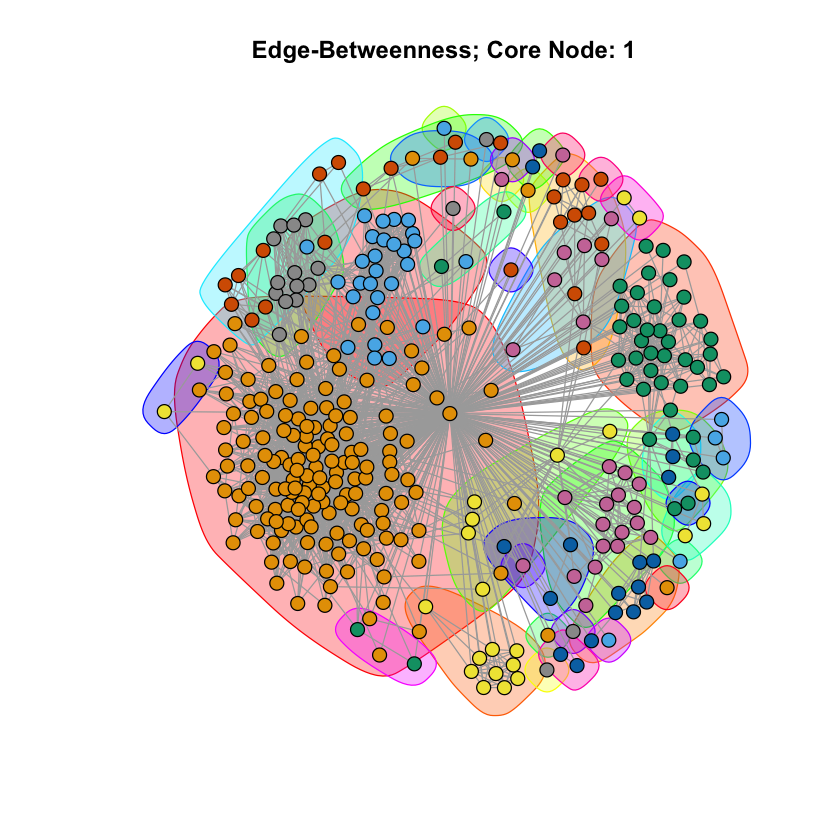


Node: 108 
[1] "Fast-Greedy Modularity Node 108 is 0.435929376026475"
[1] "Edge-Betweenness Modularity Node 108 is 0.506754916538902"
[1] "Info Map Modularity Node 108 is 0.508223340384871"


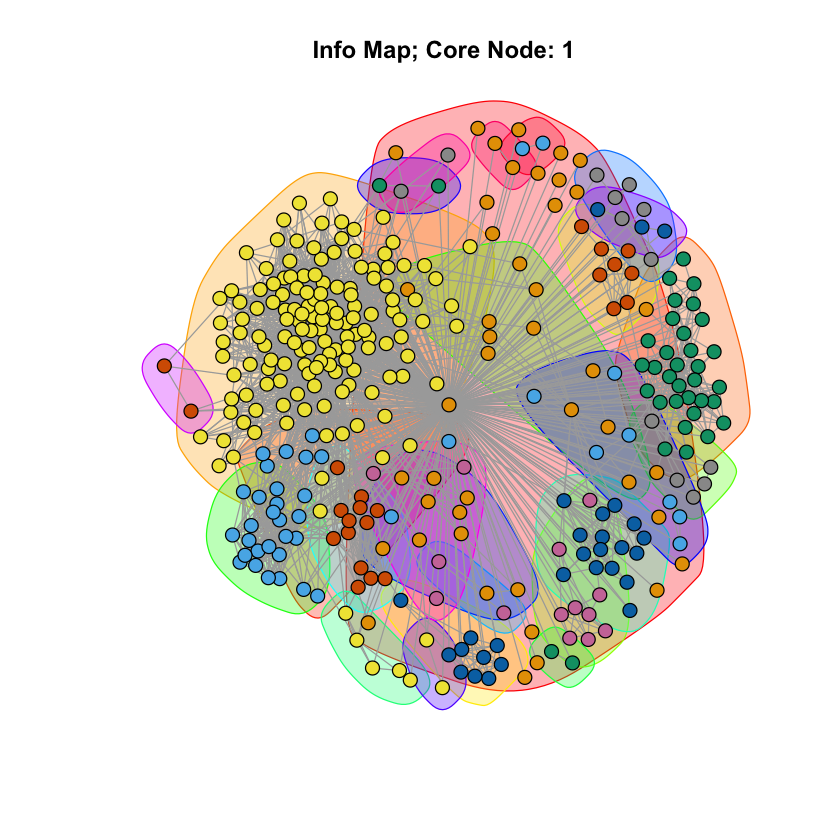

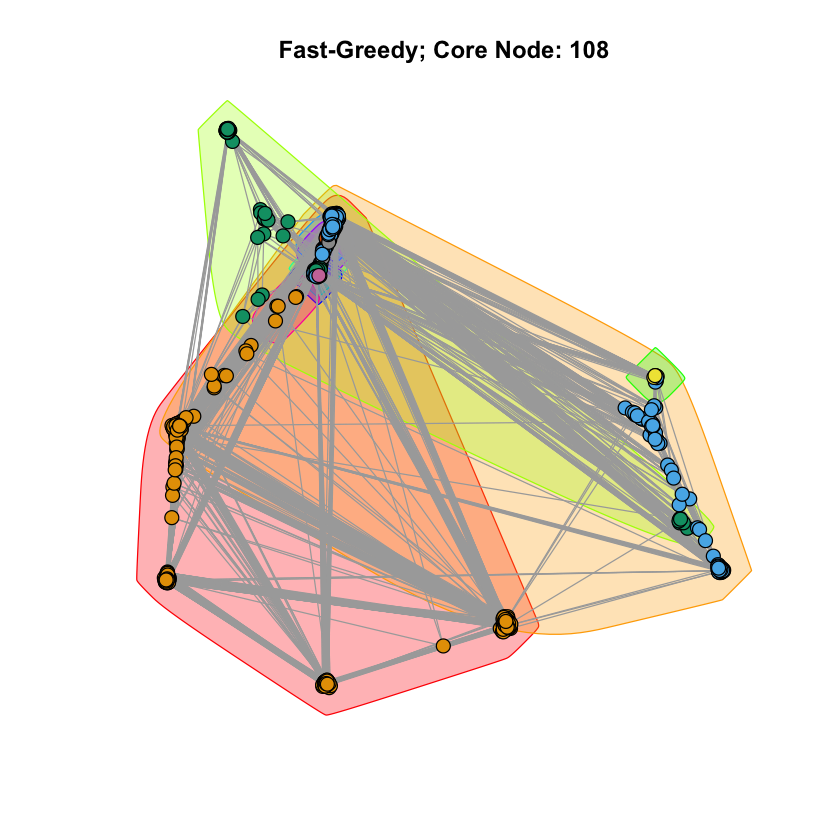

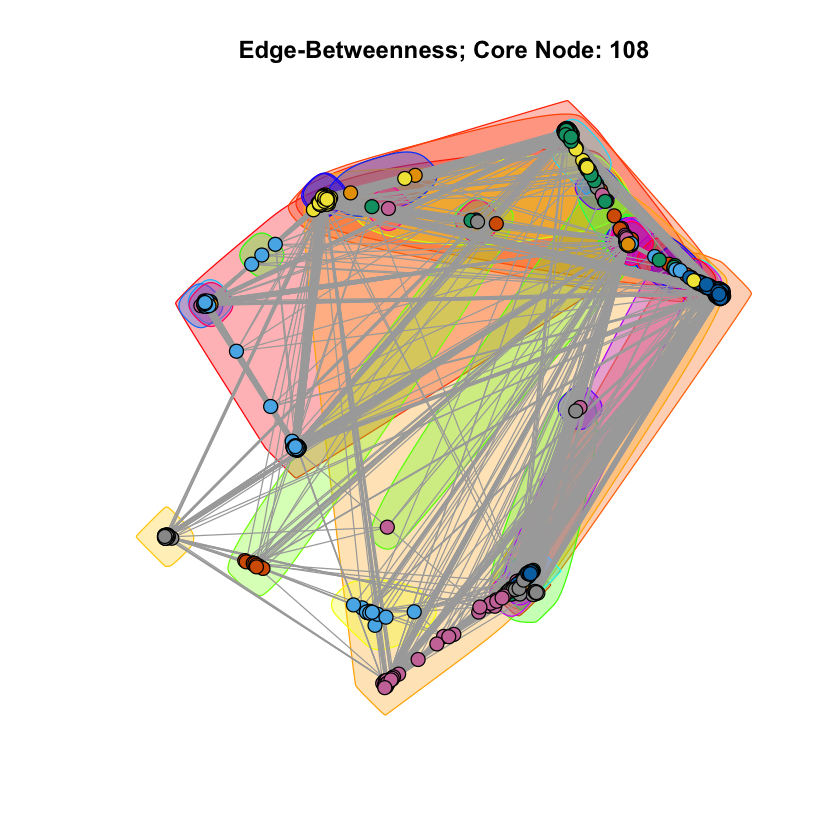


Node: 349 
[1] "Fast-Greedy Modularity Node 349 is 0.251714858543331"
[1] "Edge-Betweenness Modularity Node 349 is 0.133528021370078"
[1] "Info Map Modularity Node 349 is 0.203752997872299"


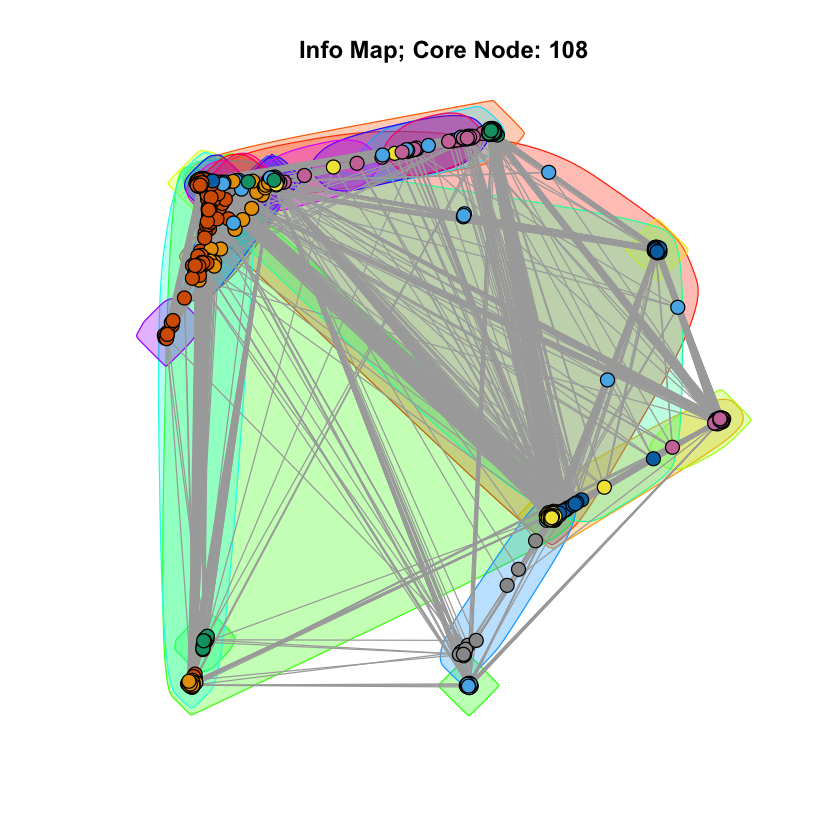

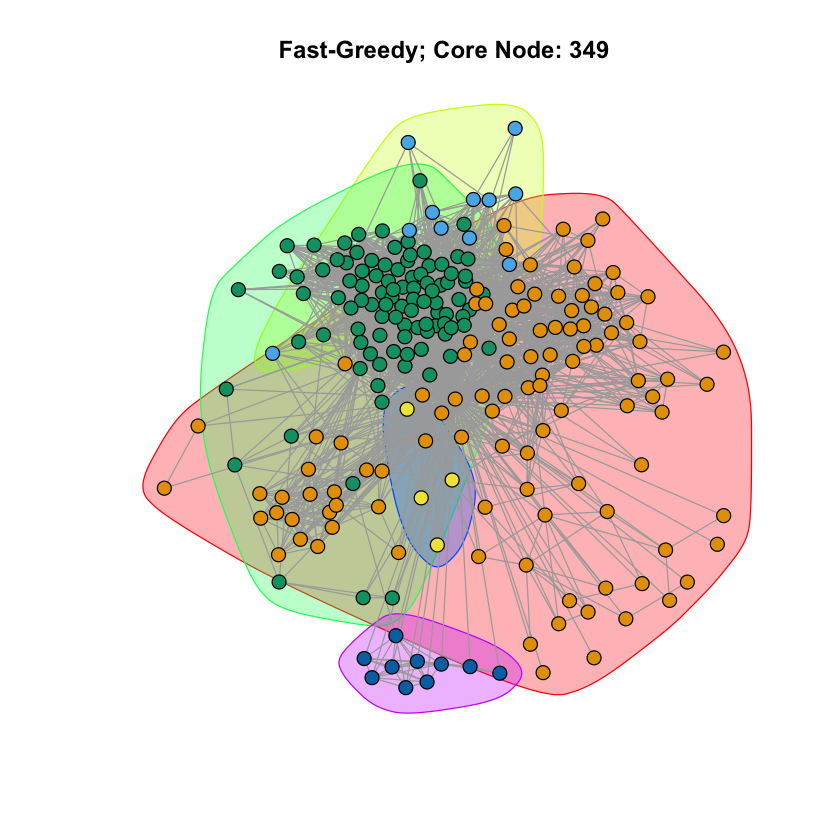

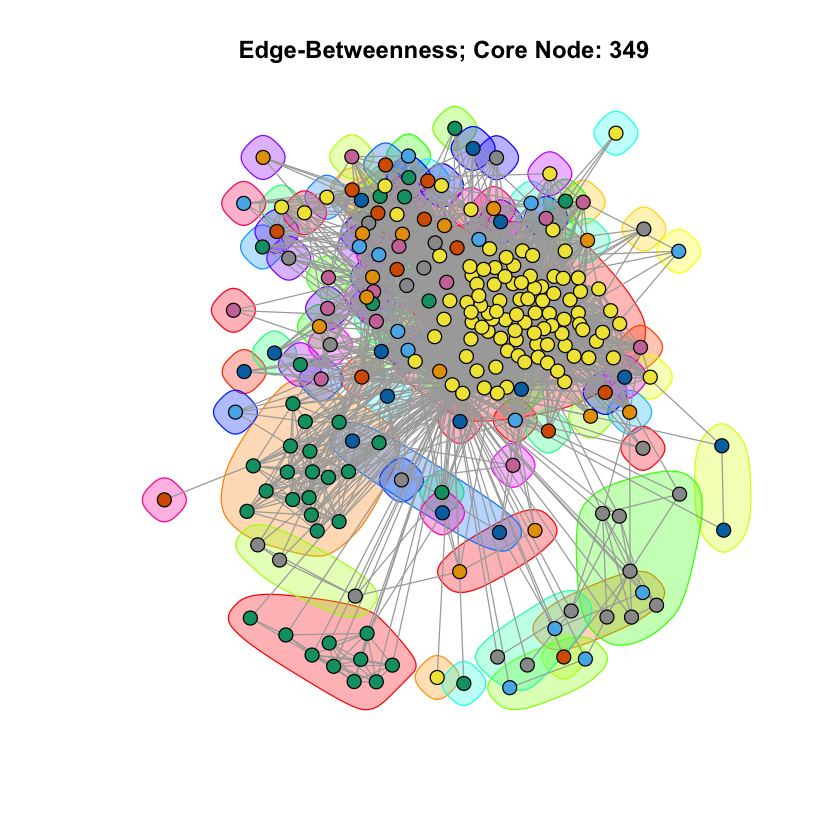


Node: 484 
[1] "Fast-Greedy Modularity Node 484 is 0.507001642196514"
[1] "Edge-Betweenness Modularity Node 484 is 0.489095180244803"
[1] "Info Map Modularity Node 484 is 0.515278752174842"


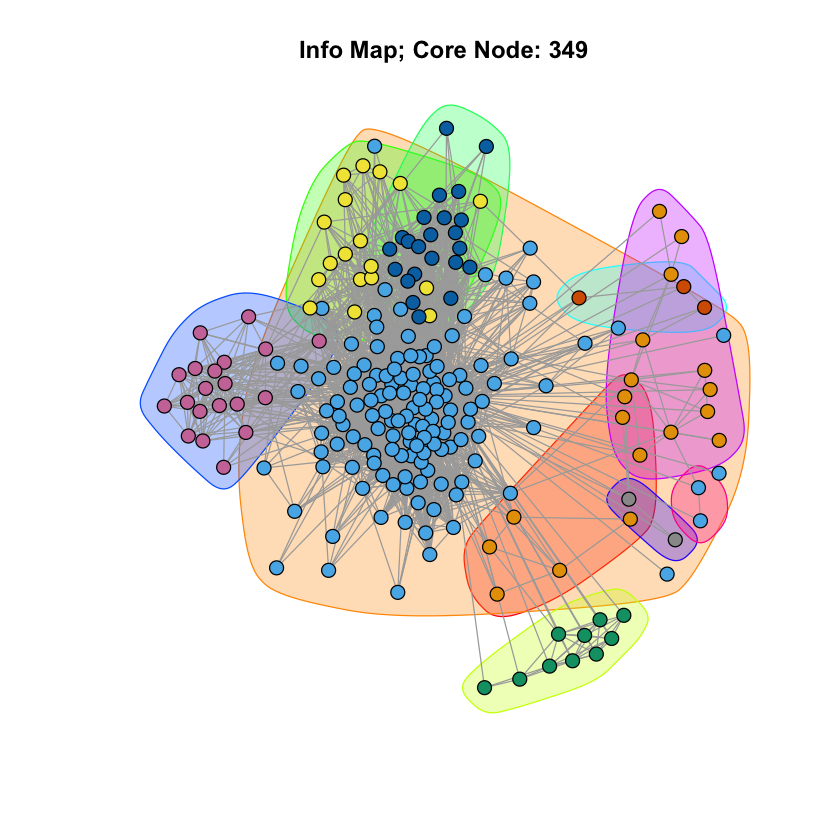

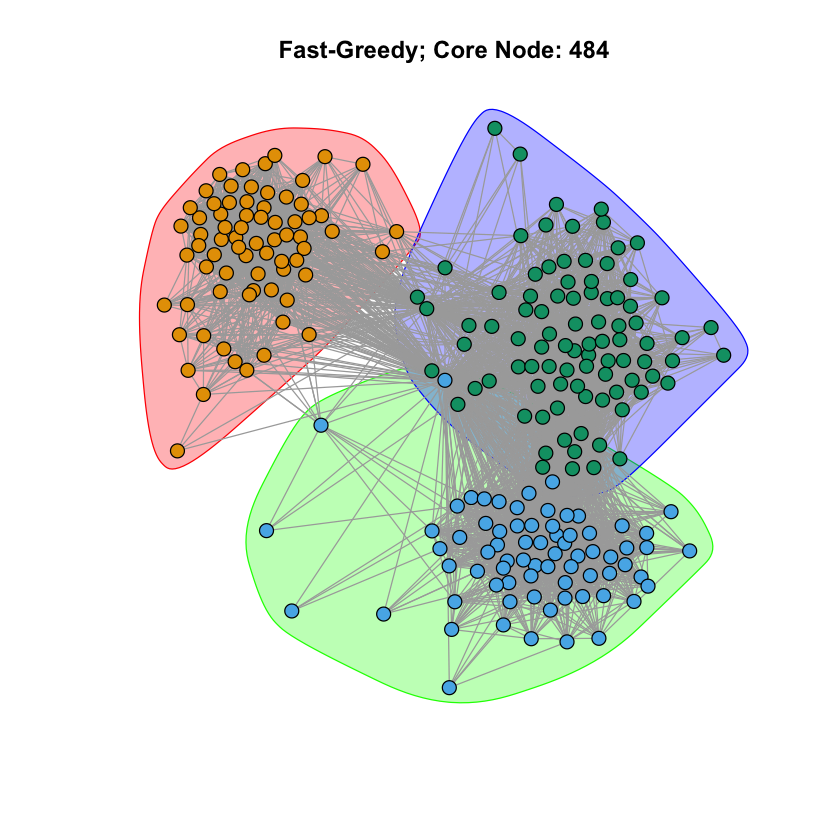

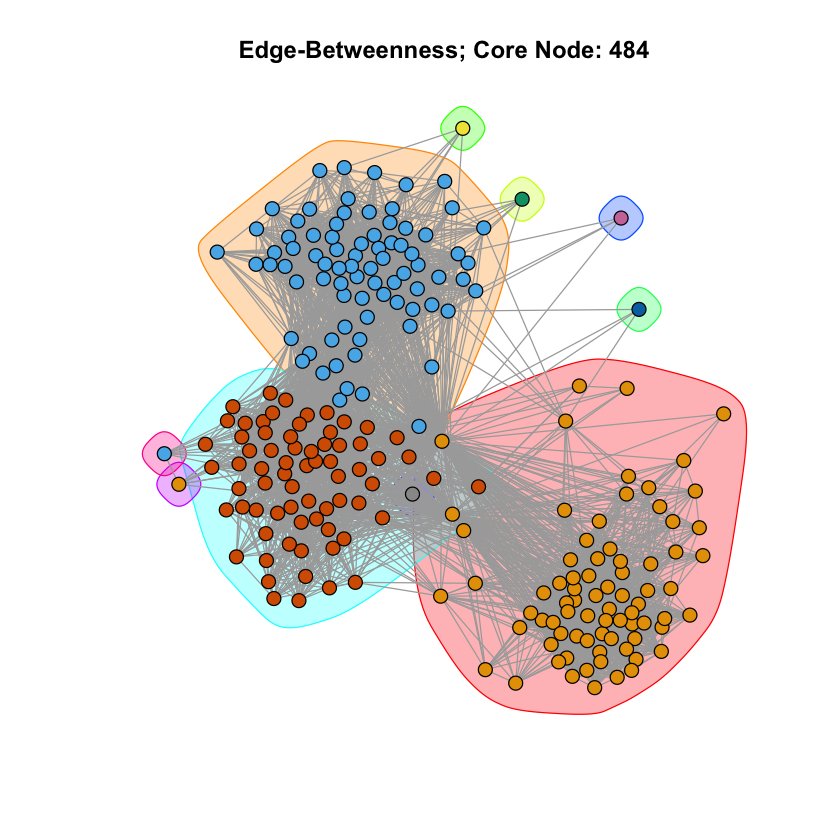


Node: 1087 
[1] "Fast-Greedy Modularity Node 1087 is 0.145531499565493"
[1] "Edge-Betweenness Modularity Node 1087 is 0.0276237723884639"
[1] "Info Map Modularity Node 1087 is 0.0269066172233356"


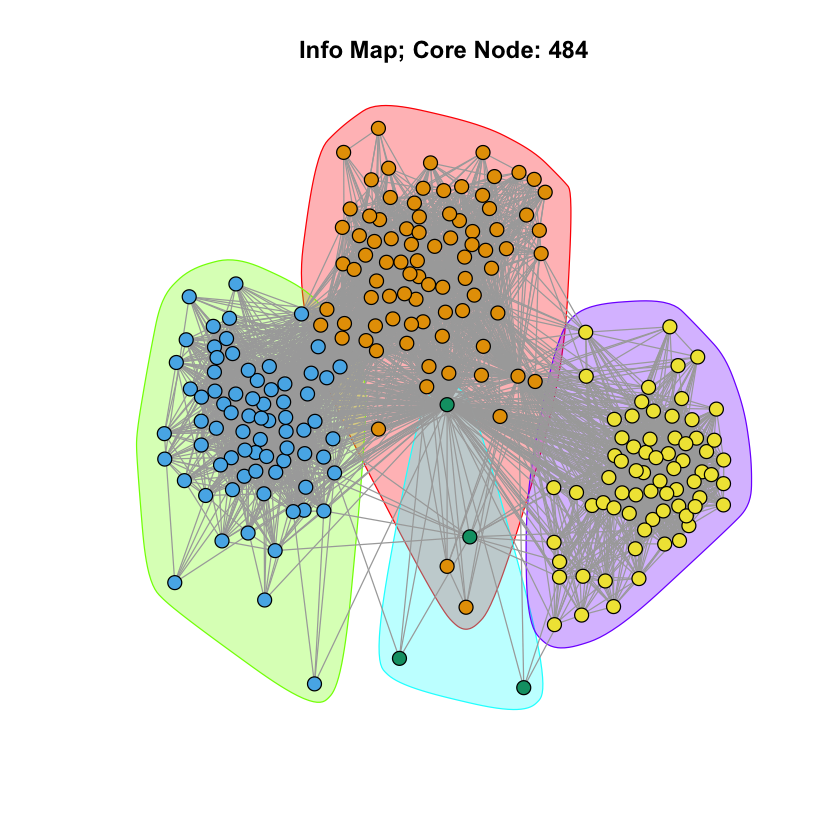

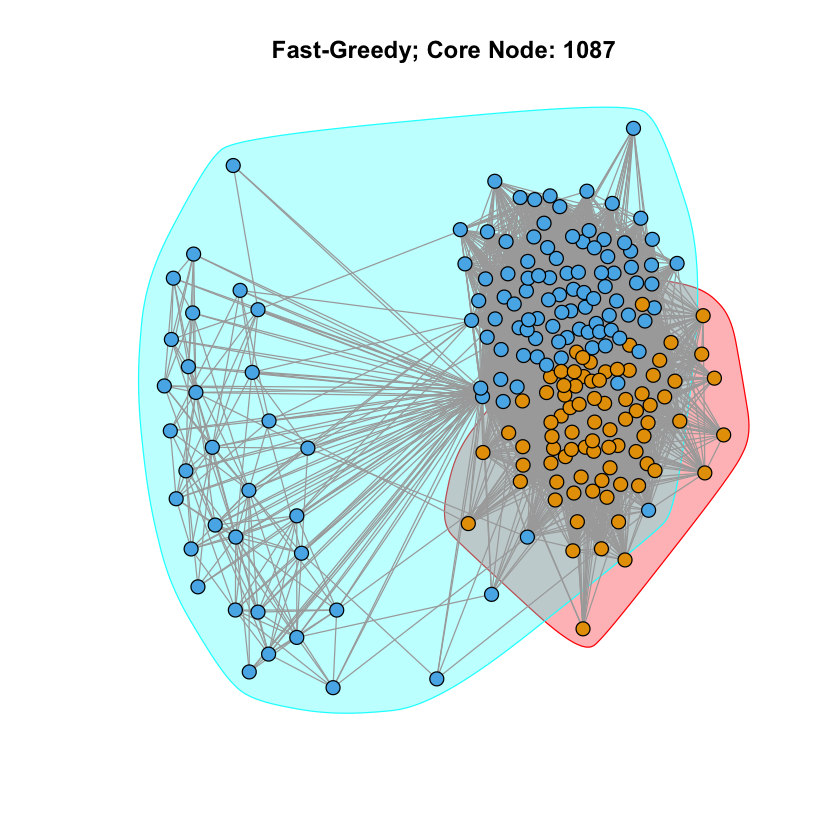

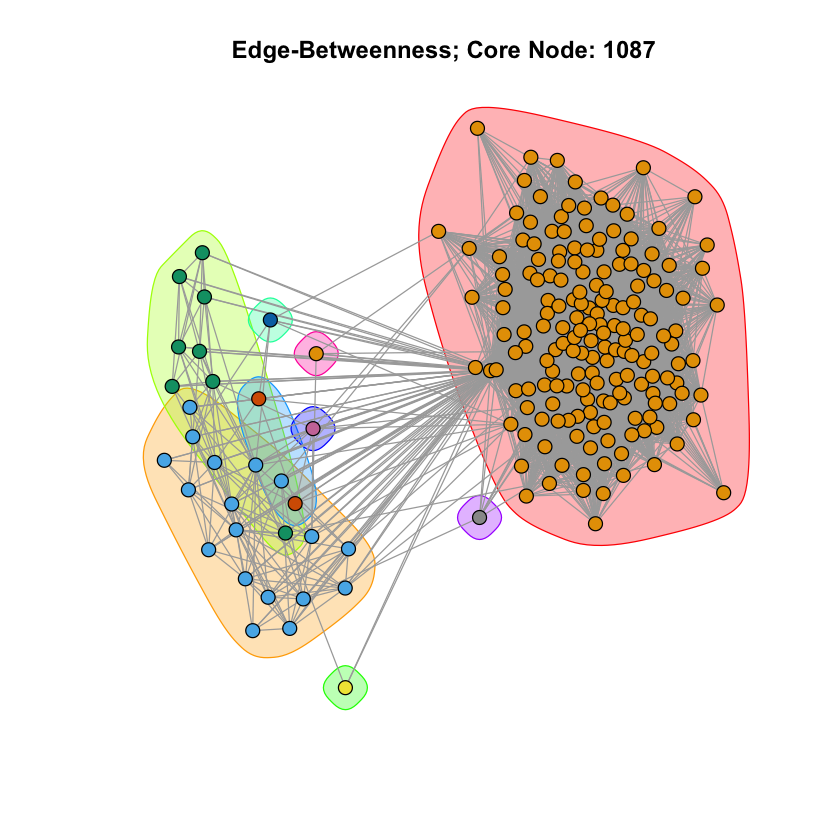

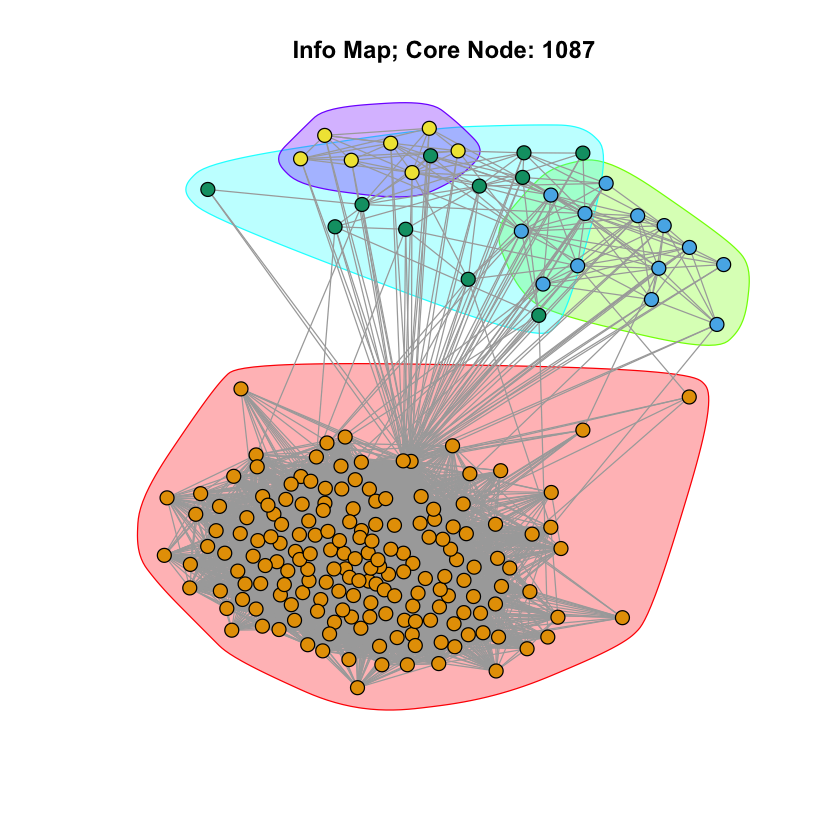

In [85]:
core_nodes = c(1, 108, 349, 484, 1087)

for (i in core_nodes) {
    community_detect(induced.subgraph(g, c(i, neighbors(g,i))), i)
}

Across different nodes, there is no apparent pattern consistent with the trends in modularity scores of the algorithms. It seems to be haphazard.

### 3.2. Community structure with the core node removed

Question 10: For each of the core node’s personalized network (use same core nodes as Question 9), remove the core node from the personalized network and find the community structure of the modified personalized network. Use the same community detection algorithm as Question 9. Compare the modularity score of the community structure of the modified personalized network with the modularity score of the community structure of the personalized network of Question 9. For visualization purpose, display the community structure of the modified personalized network using colors. In this question, you should have 15 plots in total.


Node: 1 
[1] "Fast-Greedy Modularity Node 1 is 0.44185326886839"
[1] "Edge-Betweenness Modularity Node 1 is 0.41614614203983"
[1] "Info Map Modularity Node 1 is 0.418007659453891"


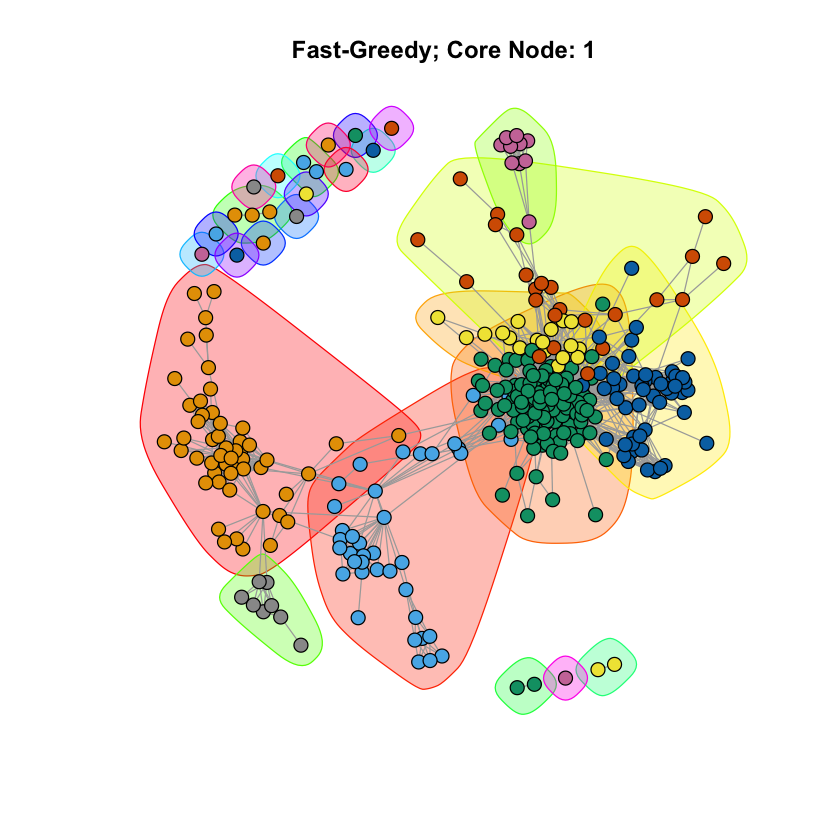

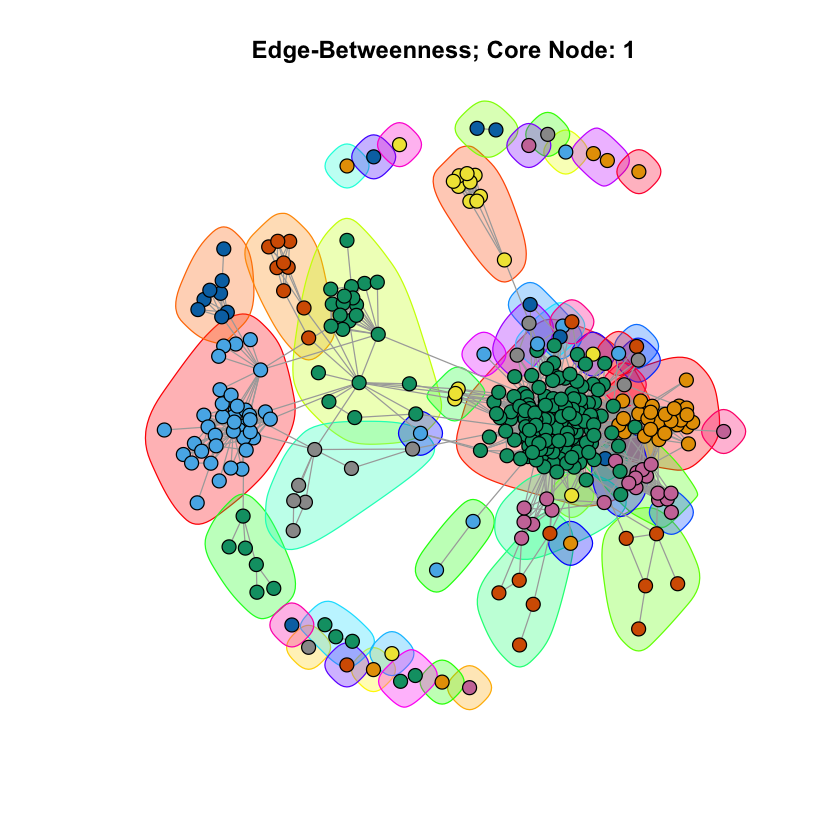


Node: 108 
[1] "Fast-Greedy Modularity Node 108 is 0.458127093719977"
[1] "Edge-Betweenness Modularity Node 108 is 0.521321576382217"
[1] "Info Map Modularity Node 108 is 0.519916093982007"


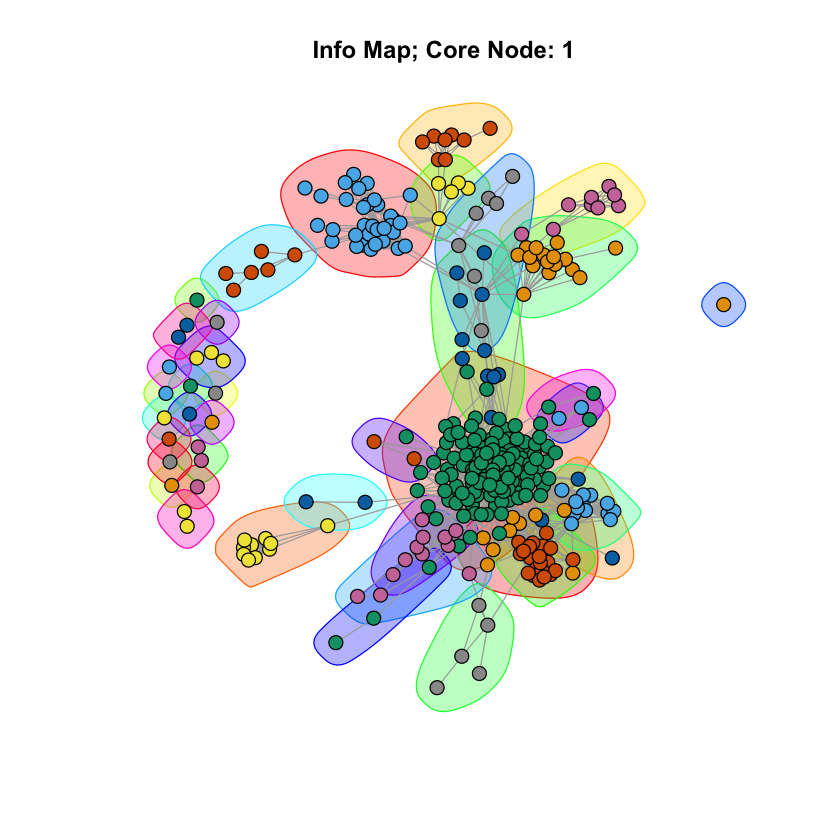

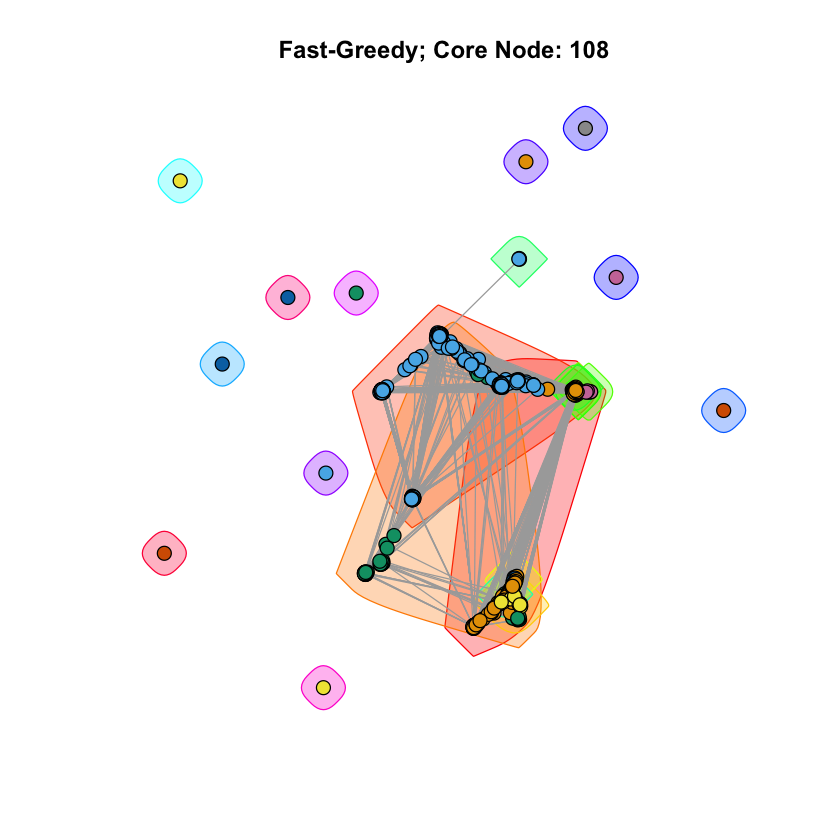

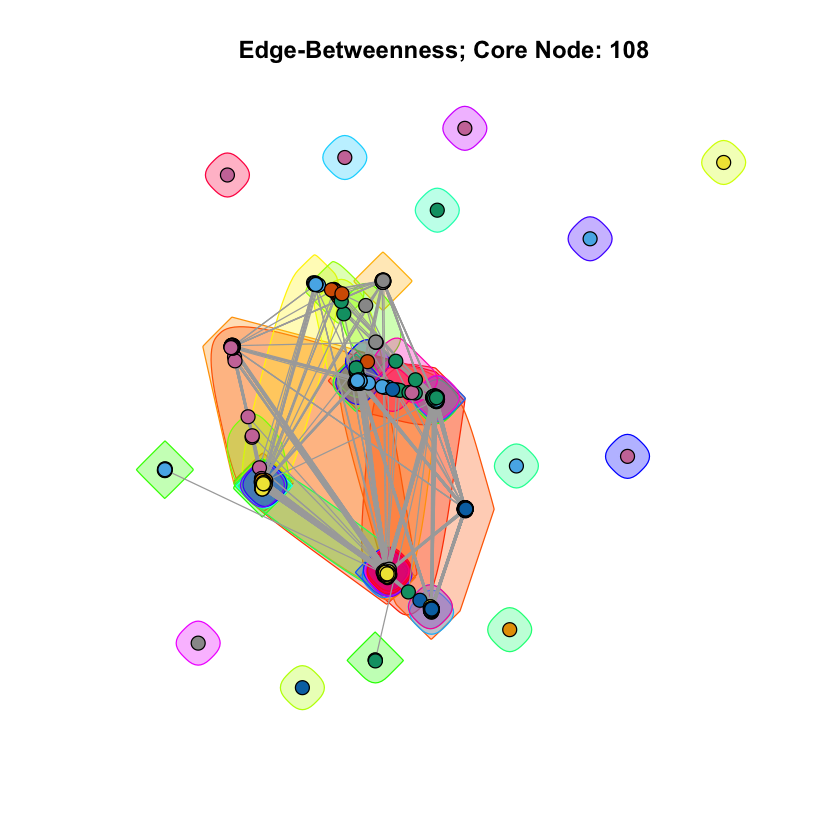


Node: 349 
[1] "Fast-Greedy Modularity Node 349 is 0.245691795942674"
[1] "Edge-Betweenness Modularity Node 349 is 0.150566340187559"
[1] "Info Map Modularity Node 349 is 0.246578492623397"


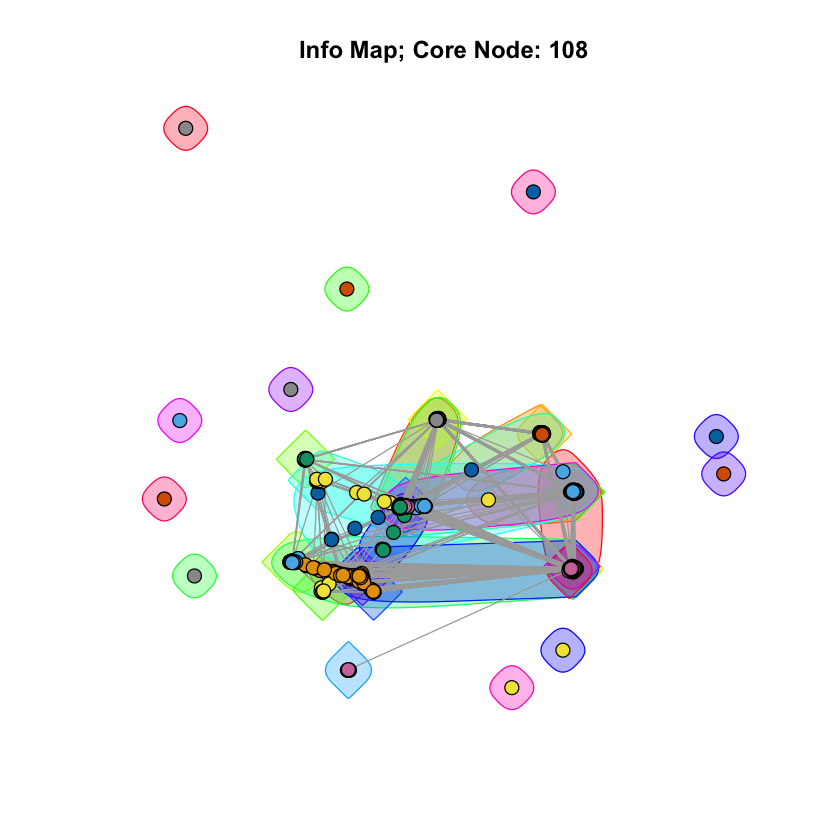

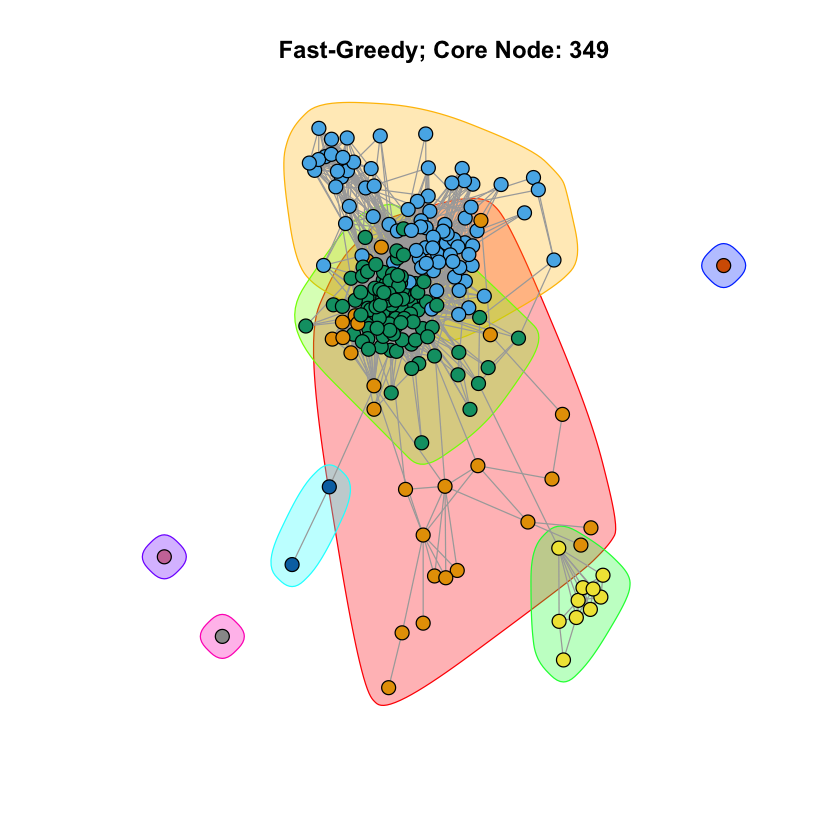

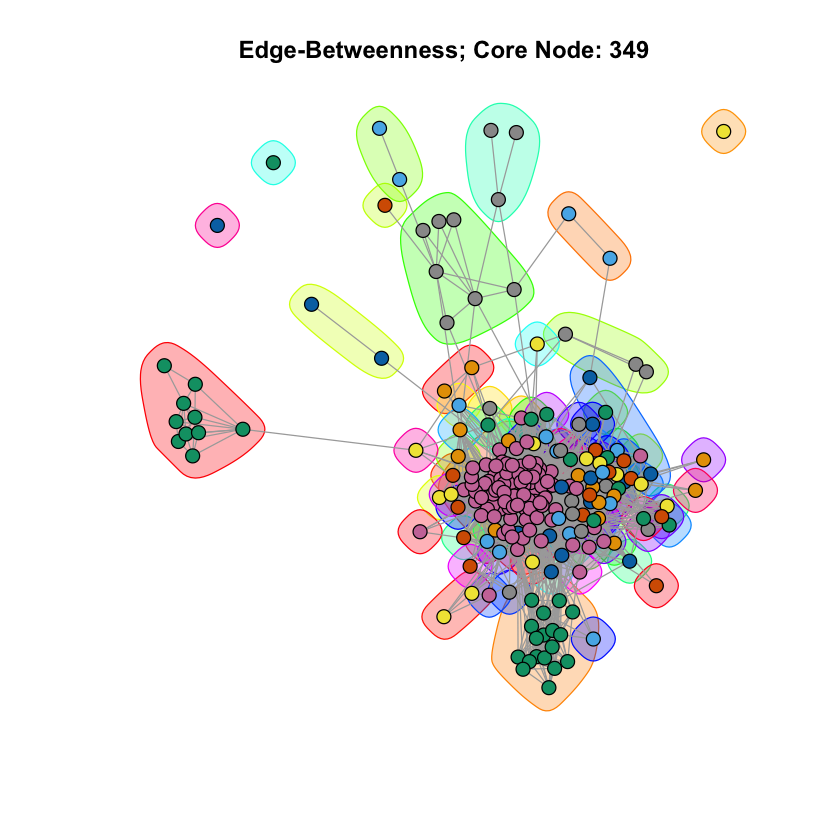


Node: 484 
[1] "Fast-Greedy Modularity Node 484 is 0.534214154606172"
[1] "Edge-Betweenness Modularity Node 484 is 0.515441277123504"
[1] "Info Map Modularity Node 484 is 0.543443679279522"


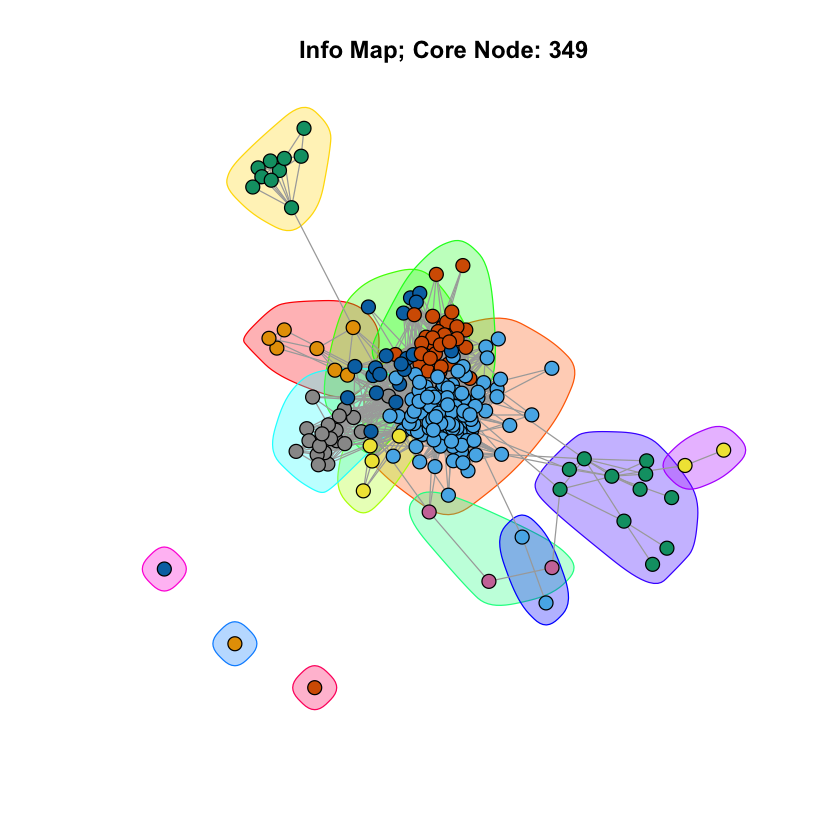

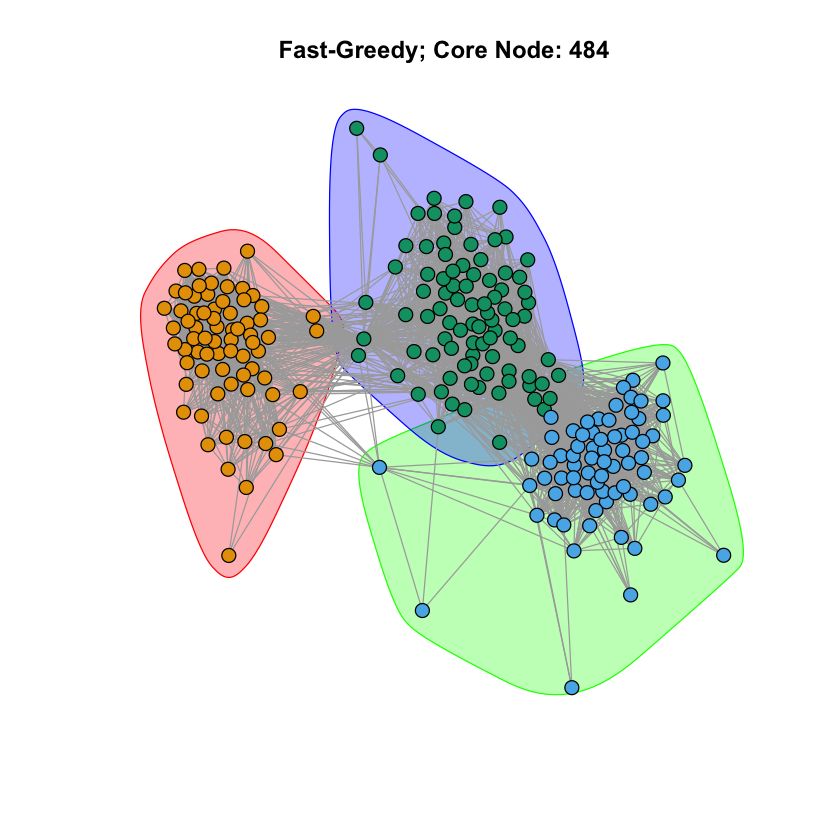

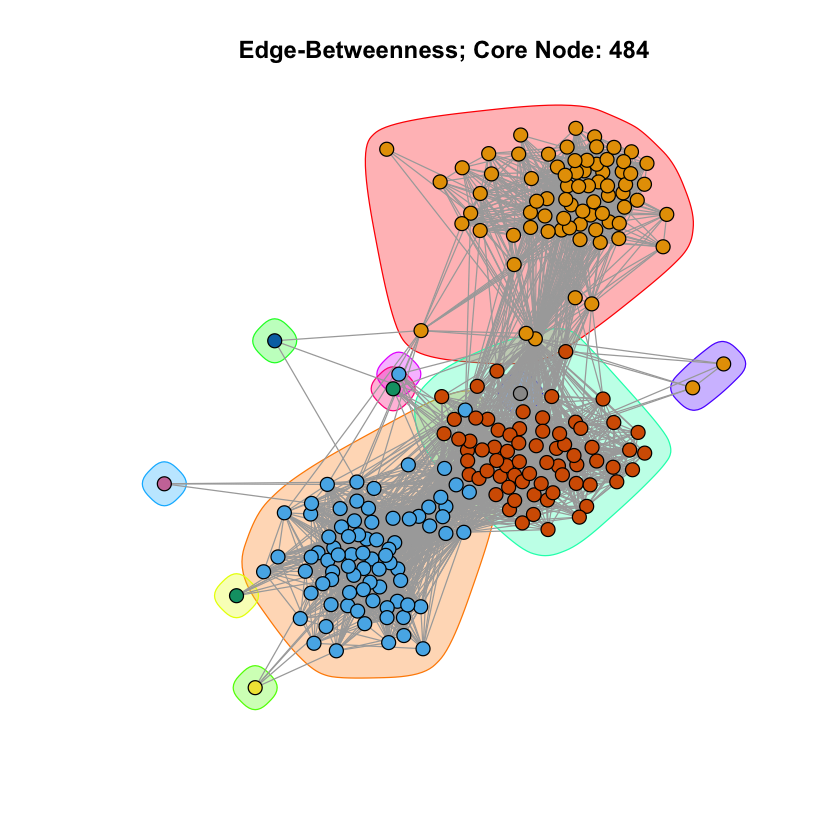


Node: 1087 
[1] "Fast-Greedy Modularity Node 1087 is 0.148195631953499"
[1] "Edge-Betweenness Modularity Node 1087 is 0.0324952980499141"
[1] "Info Map Modularity Node 1087 is 0.0273715944871147"


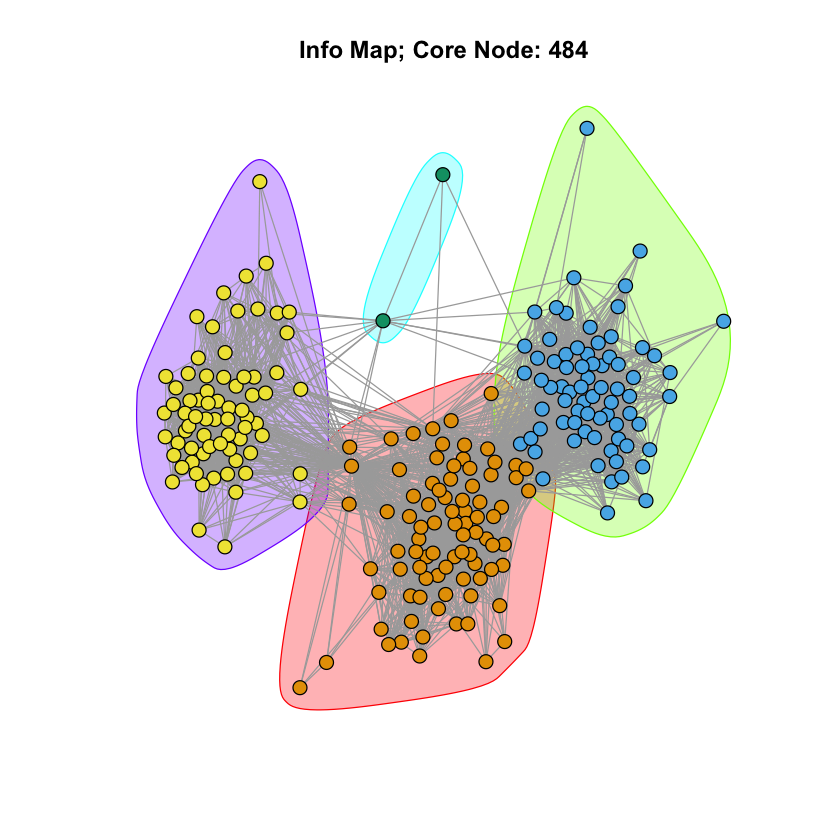

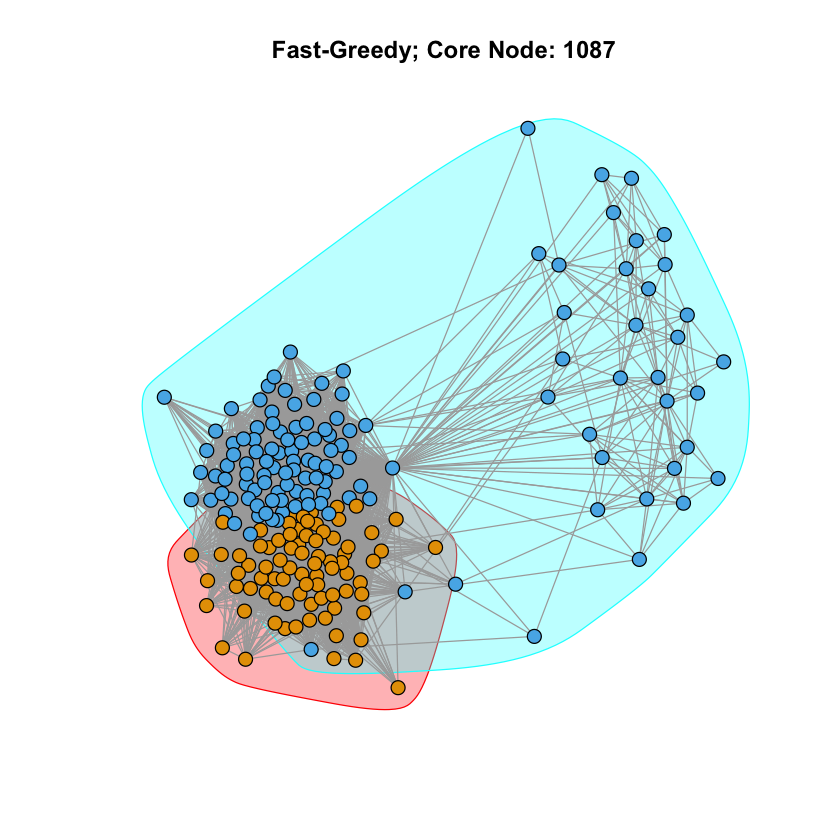

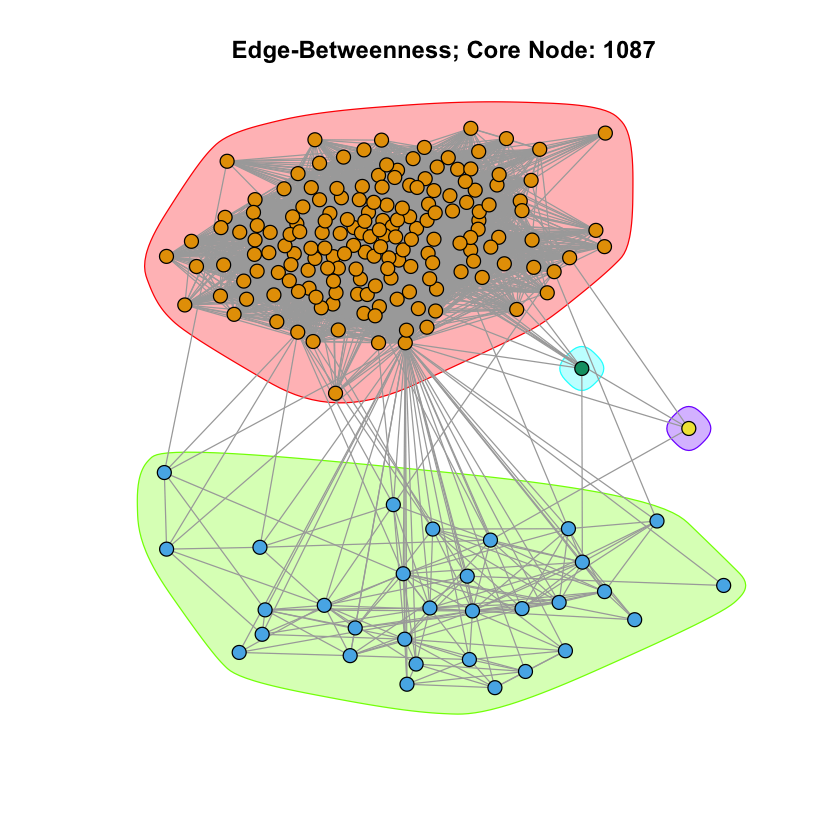

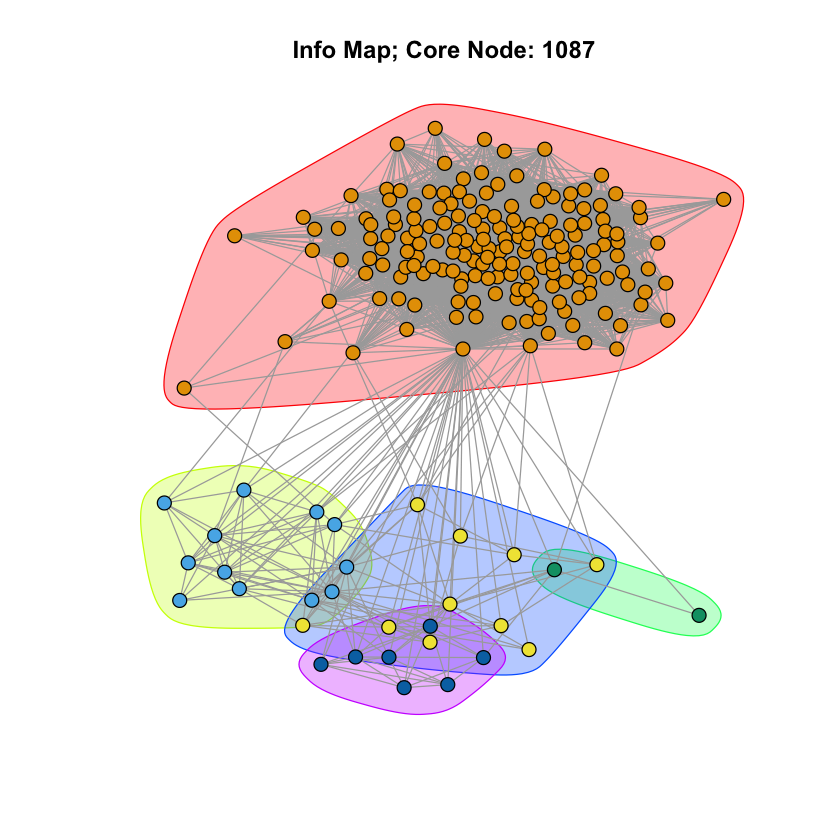

In [ ]:
core_nodes = c(1, 108, 349, 484, 1087)

for (i in core_nodes) {
    community_detect(induced.subgraph(g, neighbors(g,i)), i)
}

After the core node is removed, the modularity scores of the personalized network appear to have increased from before.

### 3.3. Characteristic of nodes in the personalized network

Question 11: Write an expression relating the Embeddedness between the core node and a non-core node to the degree of the non-core node in the personalized network of the core node.

Question 12: For each of the core node’s personalized network (use the same core nodes as Question 9), plot the distribution histogram of embeddedness and dispersion. In this question, you will have 10 plots.

In [ ]:
## Helper functions for measuring embeddedness and dispersion

#Embeddedness functions
mutual_friends <- function(g, x, y) {
  y_neighbor <- neighbors(g, y)
  x_neighbor <- neighbors(g, x)
  return (intersection(y_neighbor, x_neighbor))
}

embeddedness <- function(g, x, y) {
  return (length(mutual_friends(g, x, y)))
}

#Dispersion function 
dispersion_func <- function(g, node_id) {
  g1 = induced.subgraph(g, c(node_id, neighbors(g, node_id)))
  nei = neighbors(g, node_id)
  d = diameter(g1)
  dispersion = numeric(0)
  embeddedness = numeric(0)

  for(i in 1:length(nei)) {
    embeddedness = c(embeddedness, length(intersect(nei, neighbors(g, nei[i]))))
  }
  for(i in 1:length(nei)) {
    mutual_friends = intersect(nei, neighbors(g, nei[i]))
    delete_vert = delete.vertices(g1, c(which(V(g1)$name == node_id), which(V(g1)$name==nei[i])))
    dist = numeric(0)
    for(x in 1:length(mutual_friends)) {
      for(y in (x + 1):length(mutual_friends)) {
        temp = distances(delete_vert, which(V(delete_vert)$name == mutual_friends[x]), which(V(delete_vert)$name == mutual_friends[y])) 
        if(length(temp) == 0 || is.infinite(temp)) {
          temp = d + 2
        }
        dist = c(dist, temp)  
      }
    }
    dispersion = c(dispersion, sum(dist))
  }
  hist(dispersion[which(dispersion!=Inf)], breaks = 50, main="Dispersion Distribution", xlab="Dispersion")
}

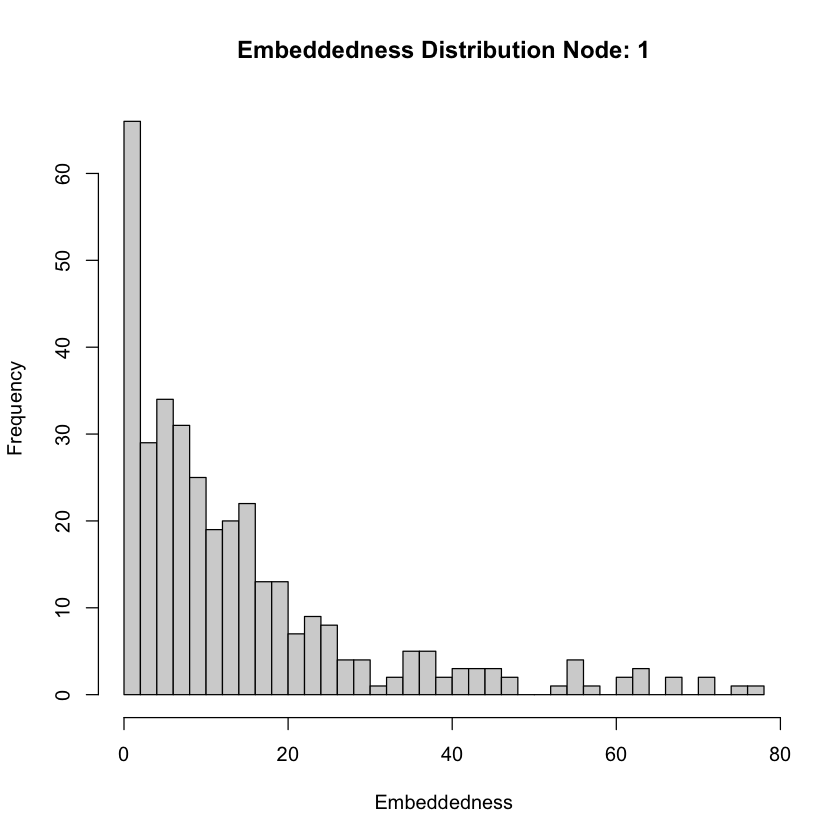

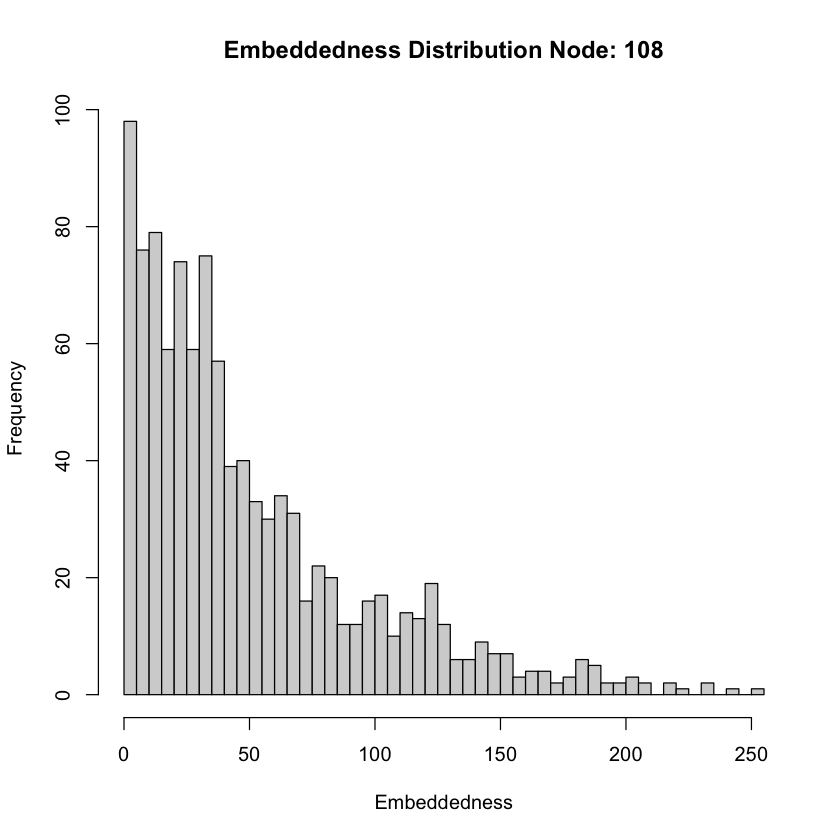

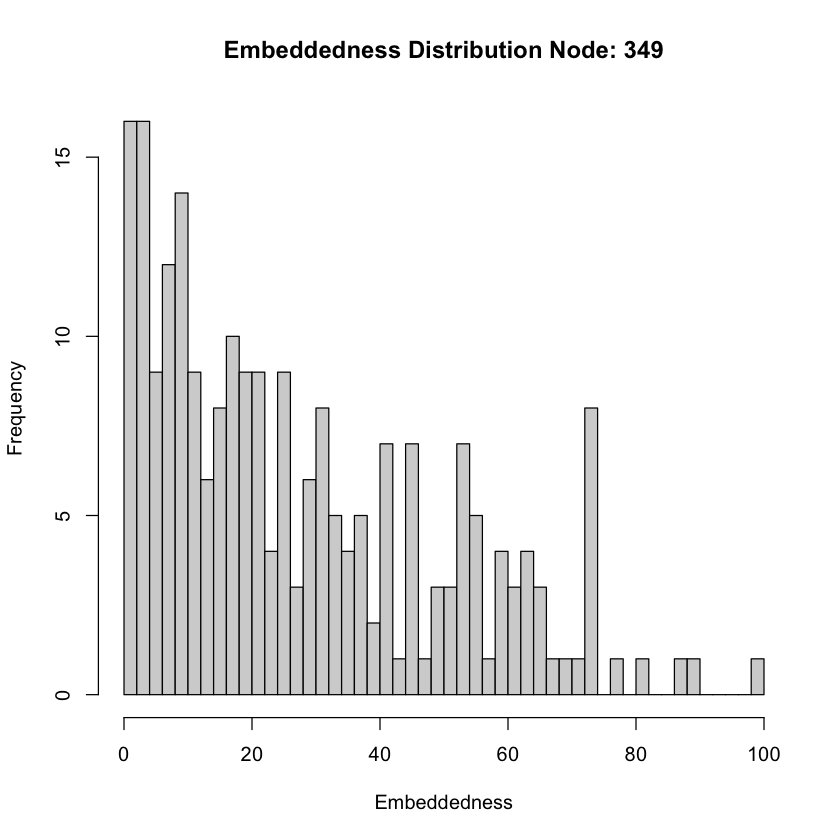

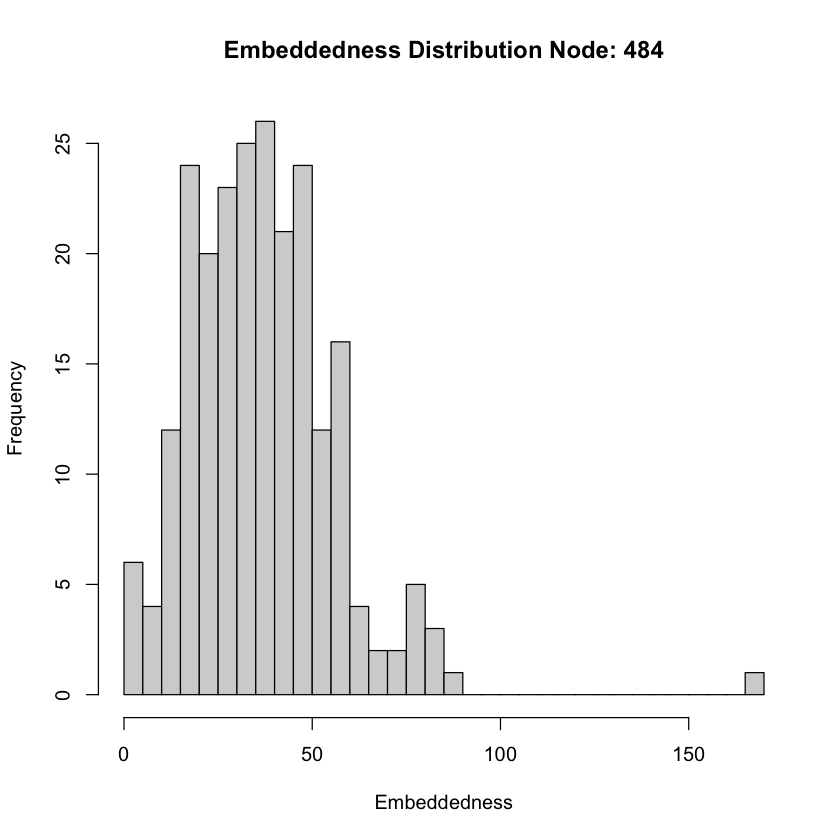

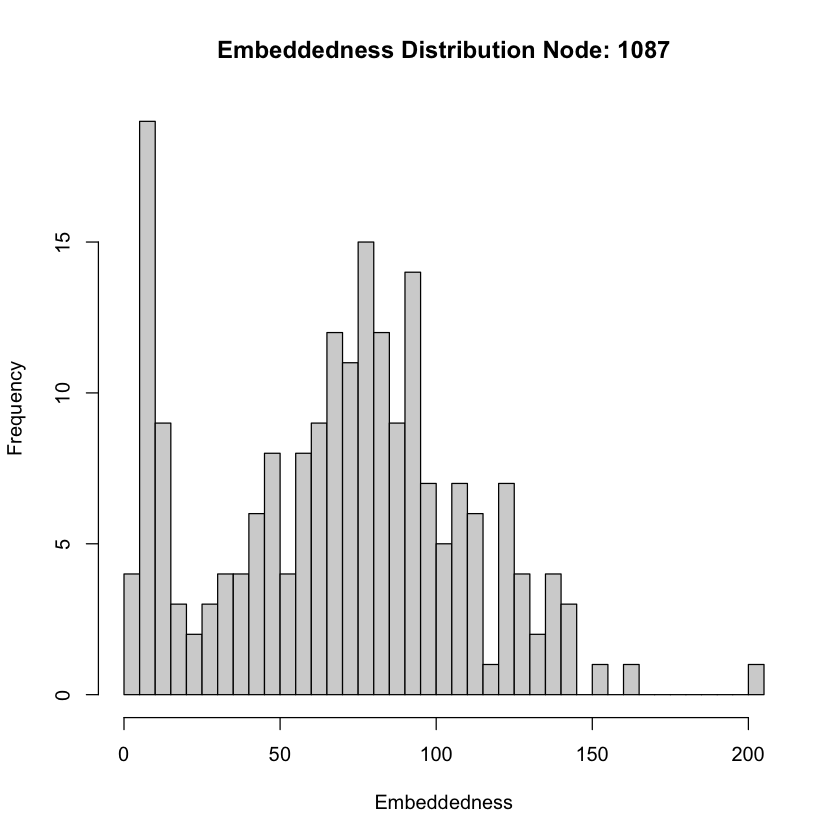

In [ ]:
#Plotting embededdness distribution for Node ID
core_nodes = c(1, 108, 349, 484, 1087)
ego_graph = make_ego_graph(g, 1, nodes = core_nodes)

for (i in 1:length(core_nodes))
{
  embeddedness = sort(degree(ego_graph[[i]])) - 1
  embeddedness = embeddedness[1:length(embeddedness)-1]
  hist(embeddedness, breaks=50, main=paste("Embeddedness Distribution Node:", core_nodes[i]), xlab="Embeddedness")
}

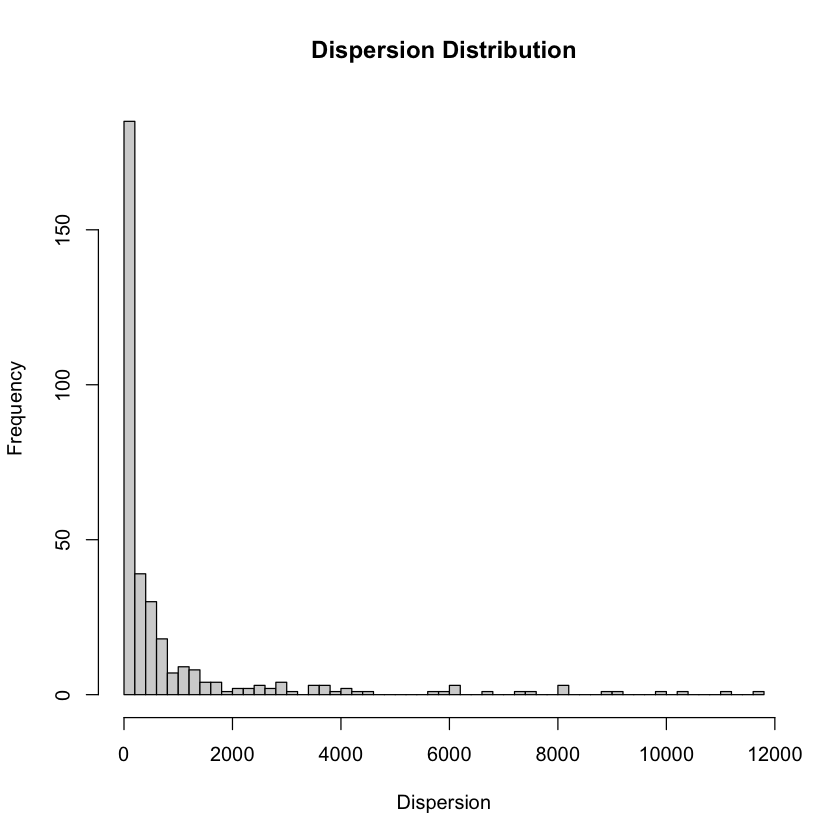

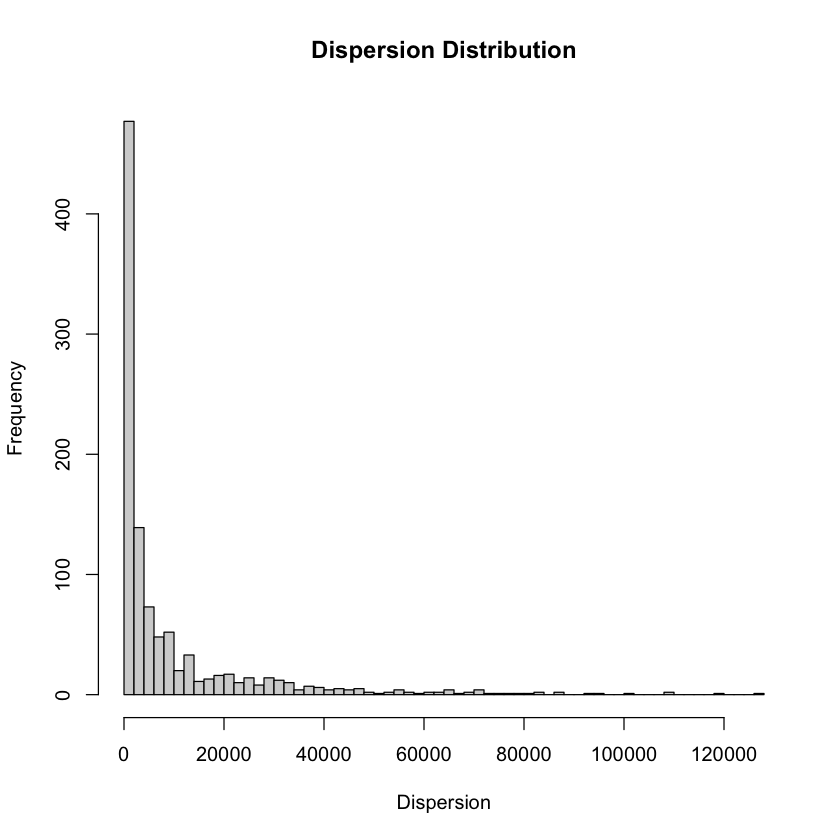

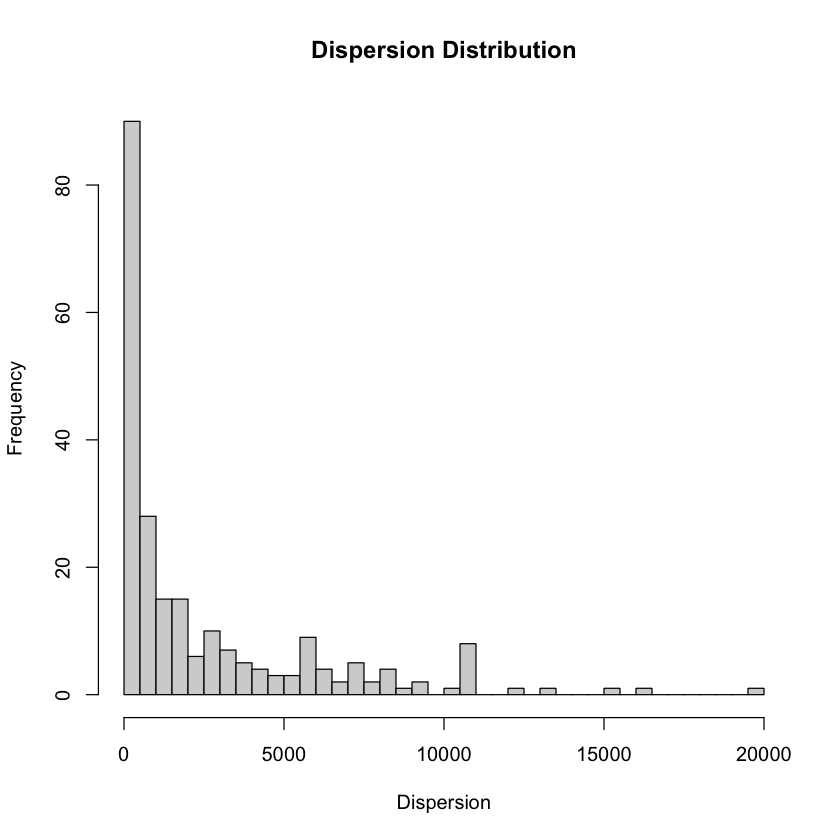

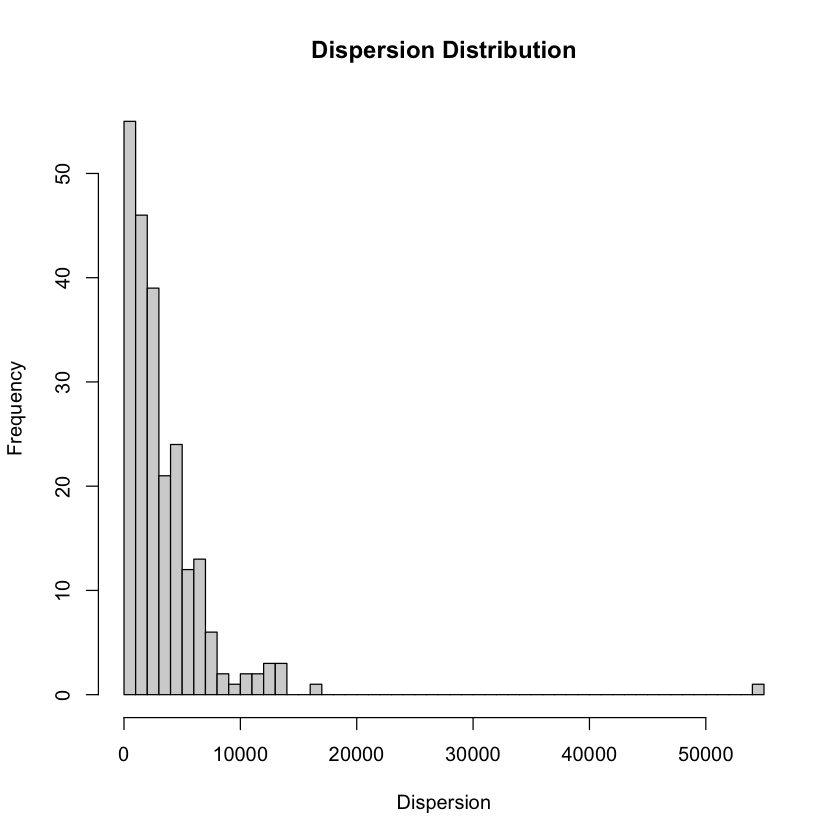

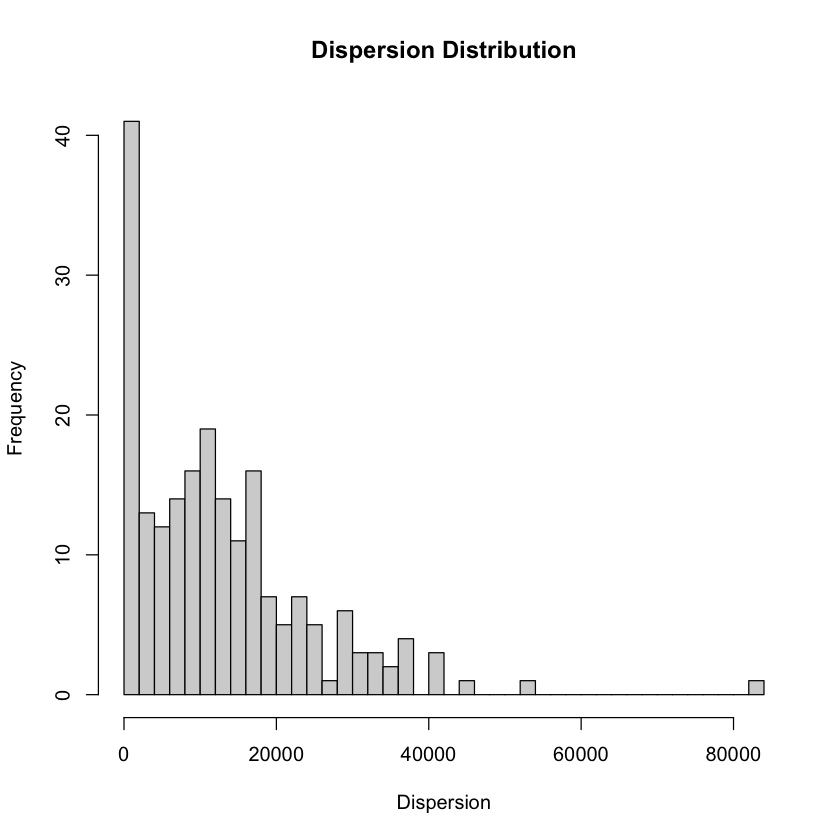

In [ ]:
#Plotting dispersion distribution for Node ID
core_nodes = c(1, 108, 349, 484, 1087)

for (i in core_nodes) {
    dispersion_func(g, i)
}

Question 13: For each of the core node’s personalized network, plot the community structure of the personalized network using colors and highlight the node with maximum dispersion. Also, highlight the edges incident to this node. To detect the community structure, use Fast-Greedy algorithm. In this question, you will have 5 plots.

In [ ]:
max_dispersion_func <- function(g, node_id) {
  g1 = induced.subgraph(g, c(node_id, neighbors(g, node_id)))
  nei = neighbors(g, node_id)
  d = diameter(g1)
  dispersion = numeric(0)
  embeddedness = numeric(0)

  for(i in 1:length(nei)) {
    embeddedness = c(embeddedness, length(intersect(nei, neighbors(g, nei[i]))))
  }
  for(i in 1:length(nei)) {
    mutual_friends = intersect(nei, neighbors(g, nei[i]))
    delete_vert = delete.vertices(g1, c(which(V(g1)$name == node_id), which(V(g1)$name==nei[i])))
    dist = numeric(0)
    for(x in 1:length(mutual_friends)) {
      for(y in (x + 1):length(mutual_friends)) {
        temp = distances(delete_vert, which(V(delete_vert)$name == mutual_friends[x]), which(V(delete_vert)$name == mutual_friends[y])) 
        if(length(temp) == 0 || is.infinite(temp)) {
          temp = d + 2
        }
        dist = c(dist, temp)  
      }
    }
    dispersion = c(dispersion, sum(dist))
  }
#   hist(dispersion[which(dispersion!=Inf)], breaks = 50, main="Dispersion Distribution", xlab="Dispersion")
  return(nei[which.max(unlist(dispersion))])
}

In [ ]:
plot_dispersion = function(g, node_id) {
    fg <- fastgreedy.community(g)
    print(sprintf('Fast-Greedy Modularity Node %s is %s', node_id, modularity(fg)))
    max_disp = max_dispersion_func(g, i)
    print(sprintf('Max Dispersion %s is %s', node_id, max_disp))
    V(g)[max_disp]$color <- "black"
    E(g)[incident(g, max_disp)]$color <- "black"
    plot(g, mark.groups = groups(fg), edge.arrow.size=0.1, vertex.color=fg$membership, vertex.size=5, vertex.label = NA, main=sprintf("Fast-Greedy; Core Node: %s", node_id))    
    cat('\n')
}

[1] "Fast-Greedy Modularity Node 1 is 0.413101372834235"
[1] "Max Dispersion 1 is 57"

[1] "Fast-Greedy Modularity Node 108 is 0.435929376026475"
[1] "Max Dispersion 108 is 3"

[1] "Fast-Greedy Modularity Node 349 is 0.251714858543331"


ERROR: Error in neighbors(g, node_id): At core/graph/type_indexededgelist.c:770 : Given vertex is not in the graph. Invalid vertex id


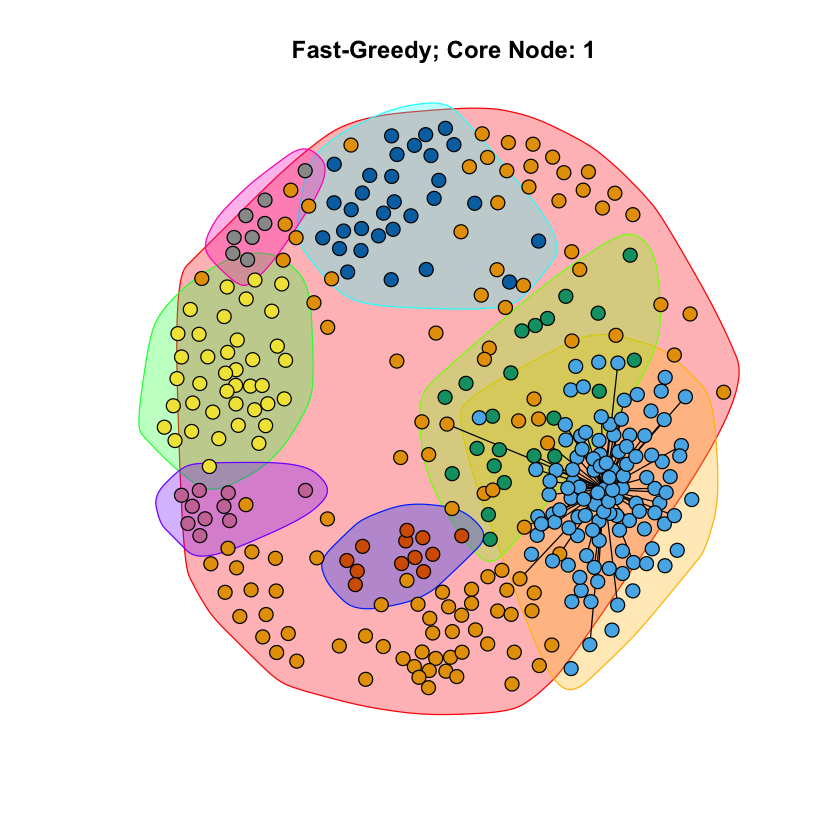

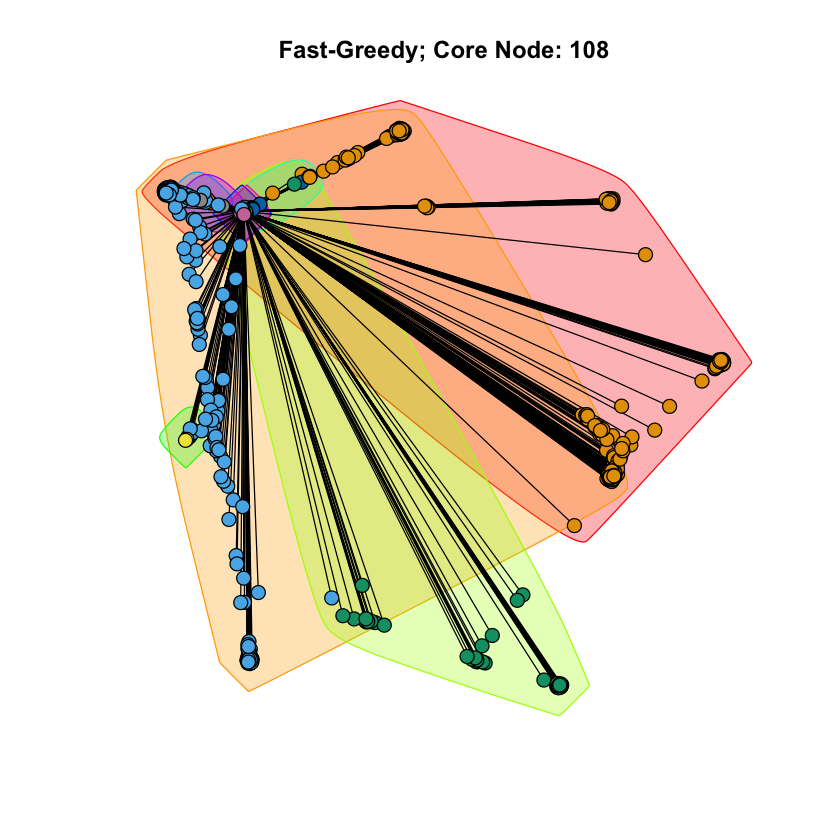

In [ ]:
core_nodes = c(1, 108, 349, 484, 1087)

for (i in core_nodes) {
    plot_dispersion(induced.subgraph(g, c(i, neighbors(g,i))), i)
}

Question 14: Repeat Question 13, but now highlight the node with maximum embeddedness and the node with maximum $\frac{dispersion}{embeddedness}$ (excluding the nodes having zero embeddedness if there are any). Also, highlight the edges incident to these nodes. Report the id of those nodes.

Question 15: Use the plots from Question 13 and 14 to explain the characteristics of a node revealed by each of this measure.

## 4. Friend recommendation in personalized networks

### 4.1. Neighborhood based measure

### 4.2. Friend recommendation using neighborhood based measures

### 4.3. Creating the list of users

Question 16: What is $|N_r|$, i.e. the length of the list $N_r$?

In [86]:
fbGraph = read_graph("facebook_combined.txt", format = 'edgelist', directed = FALSE)

N_edges = gsize(fbGraph)
N_nodes = vcount(fbGraph)

pn_415 = make_ego_graph(fbGraph, nodes = c(415))
Nr = which(degree(pn_415[[1]]) == 24)
print(paste("Number of users who need friend recommendations: ", length(Nr)))

[1] "Number of users who need friend recommendations:  11"


### 4.4. Average accuracy of friend recommendation algorithm

Question 17: Compute the average accuracy of the friend recommendation algorithm that uses:

    • Common Neighbors measure 
    • Jaccard measure
    • Adamic Adar measure
    
Based on the average accuracy values, which friend recommendation algorithm is the best?

In [87]:
metric_comparison <- function(Nr, G, metric, n_steps) {
    avg_acc = c()
    for(user in Nr) {
        acc = c()
        for(step in c(1:n_steps)) {
            R = c()
            tempG = pn_415[[1]]
            nb_user = neighbors(tempG, user)
            for(n in nb_user) {
                if(runif(1, 0, 1) <= 0.25) {
                    tempG = delete_edges(tempG, edge(n, user))
                    R = c(R, n)
                }
            }
            
            left_neighbors = setdiff(nb_user, R)
            left_neighbors = c(left_neighbors, user)
            
            potential_neighbors = setdiff(V(tempG), left_neighbors)
            
            scores = c()
            for(node in potential_neighbors) {
                nb_node = neighbors(tempG, node)
                common = intersect(left_neighbors, nb_node)
                sc = 0
                if(metric == "common") {
                    sc = length(common)
                }
                if(metric == "jaccard") {
                    sc = length(common)/length(union(left_neighbors, nb_node))
                }
                if(metric == 'adamic_adar') {
                    sc = 0
                    
                    for(neigh in common) {
                        neighSet = length(neighbors(tempG, neigh))
                        sc = sc + 1/log(neighSet)
                    }
                }
                
                scores = c(scores, sc)
            }
            
            indices = sort(scores, decreasing = TRUE, index.return = TRUE)$ix
            recs = potential_neighbors[indices[1:length(R)]]
            inter_set <- intersect(recs, R)
            acc = c(acc, (length(inter_set) / length(R)))
        }
        avg_acc = c(avg_acc, mean(acc))
    }
    return(mean(avg_acc))
}

In [91]:
common = metric_comparison(Nr, pn_415, "common", 10)
jaccard = metric_comparison(Nr, pn_415, "jaccard", 10)
adamic_adar = metric_comparison(Nr, pn_415, "adamic_adar", 10)

print(paste("Avg. accuracy for Common neighbours approach: ", common))
print(paste("Avg. accuracy for Jaccard approach: ", jaccard))
print(paste("Avg. accuracy for Adamic Adar approach: ", adamic_adar))

[1] "Avg. accuracy for Common neighbours approach:  0.8529329004329"
[1] "Avg. accuracy for Jaccard approach:  0.832189754689755"
[1] "Avg. accuracy for Adamic Adar approach:  0.857395382395382"


The Adamic Adar approach seems to be the best for this iteration.

# 2. Google+ network

Question 18: How many personal networks are there?

Question 19: For the 3 personal networks (node ID given below), plot the in-degree and out-degree distribution of these personal networks. Do the personal networks have a similar in and out degree distribution? In this question, you should have 6 plots.

## 1. Community structure of personal networks

Question 20: For the 3 personal networks picked in Question 19, extract the community structure of each personal network using Walktrap community detection algorithm. Report the modularity scores and plot the communities using colors. Are the modularity scores similar? In this question, you should have 3 plots.

Question 21: Based on the expression for h and c, explain the meaning of homogeneity and completeness in words.

Question 22: Compute the h and c values for the community structures of the 3 personal network (same nodes as Question 19). Interpret the values and provide a detailed explanation. Are there negative values? Why?